In [1]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt

rows=6
cols=9

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((rows*cols,3), np.float32)
objp[:,:2] = np.mgrid[0:cols, 0:rows].T.reshape(-1,2)


In [3]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (cols,rows), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cols,rows), corners, ret)
        write_name = 'camera_cal/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()


### Undistort a calibration image and store output

Text(0.5, 1.0, 'Undistorted Image')

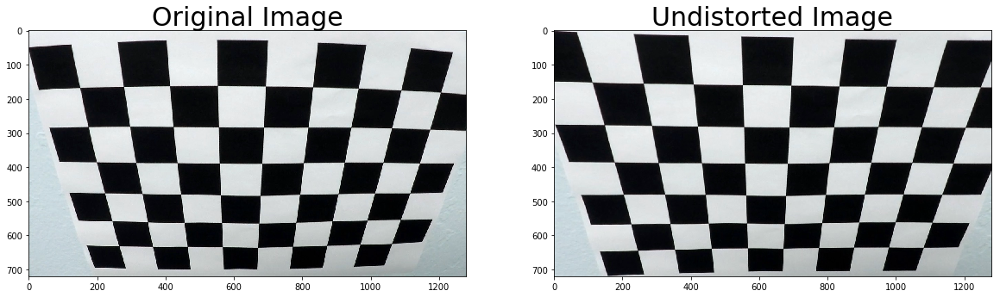

In [4]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist_calibration2.jpg',dst)

# Visualize undistorted Images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Calculate Perspective Transformation matrix

In [5]:
# Using the first image to calculate perspective transform
# src = np.float32([[240,702],[1044,702],[703,461],[582,461]])
# dst = np.float32([[240,702],[1044,702],[1044,461],[240,461]])

img = mpimg.imread('test_images/straight_lines1.jpg')

#Get image data
max_y = img.shape[0]
max_x = img.shape[1]
img_size = (max_x, max_y)

#Create source image points
src = np.float32([[max_x*0.465, max_y*0.625], #top left
                 [max_x*0.156, max_y],      #bottom left
                 [max_x*0.879, max_y],     #bottom right
                 [max_x*0.539, max_y*0.625]]) #top right

#Create destination image points
dst = np.float32([[max_x*0.234,0],
                 [max_x*0.234, max_y],
                 [max_x*0.742, max_y],
                 [max_x*0.742, 0]])
    
M = cv2.getPerspectiveTransform(src,dst)
Minv = cv2.getPerspectiveTransform(dst, src)

## Class to keep track of lanes

In [6]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # No of frames skipped without detections
        self.frame_skipped = 5
        # Max skipped frame allowed
        self._max_frame_skip = 5
        # Y Coordinates
        self.ploty = []
        
    def reinitialize_required(self):
        if self.frame_skipped<self._max_frame_skip:
            return False
        else:
            return True
        
    def skip_frame(self):
        self.current_fit = self.best_fit
        self.recent_xfitted = self.bestx
        self.frame_skipped = self.frame_skipped + 1
        self.detected = False
        
    def accept_fit(self):
        self.best_fit = self.current_fit
        self.bestx = self.recent_xfitted
        self.detected = True
        self.frame_skipped = 0

## Lane Detection Helper Functions

In [7]:
def undistortStep(image, mtx, dist, debug=False):
    undist_image = cv2.undistort(image, mtx, dist, None, mtx)
    if debug:
        print("Undistort step output:")
        plt.figure()
        plt.imshow(undist_image)
        plt.show()
    return undist_image

In [8]:

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def regionSelStep(image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = False):
    # Region Selecting From Each Image
    region_select = np.copy(image)
    ysize = image.shape[0]
    xsize = image.shape[1]

    # Vertices of a quadrilateral
    left_bottom = np.array([xsize*bottomLeftXOffset, ysize])
    right_bottom = np.array([xsize*bottomRightXOffset,ysize])
    left_top = np.array([xsize*topLeftXOffset, ysize*horizon])
    right_top = np.array([xsize*topRightXOffset, ysize*horizon])
    vertices = np.array( [[left_top,left_bottom,right_bottom,right_top]], dtype=np.int32 )
    regionImage = region_of_interest(image, vertices)
    if debug:
        ## plot final masked images
        print("Region select pipe output:")
        plt.figure()
        plt.imshow(regionImage, cmap='gray')
        plt.show()
    return(regionImage)

In [9]:
def perspectiveStep(image, M, debug=False):
    warped_color = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

    
    if debug:
        print("Perspective Transformation output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(warped_color, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return(warped_color)

In [10]:
# Edit this function to create your own pipeline.
def binaryActivationStep(img, s_thresh=(170, 255), sx_thresh=(20, 100), debug = False):
    img = np.copy(img)
    kernel_size =7
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(color_binary[:,:,1] > 1) | (color_binary[:,:,2] > 1)] = 1
    if debug:
        print("Binary Activation output:")
        plt.figure()
        plt.imshow(combined_binary, cmap = 'gray')
        plt.show()
    
    return combined_binary


In [11]:
def warpStep(image, M,  debug=False):
    result = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    if debug:
        print("Warp Image output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(image, cmap='gray')
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(result, cmap='gray')
        ax2.set_title('Warped Binary Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return result

In [12]:
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 20
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

def find_lane_pixels(binary_warped, left_lane_line, right_lane_line):
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    weighted_image = np.transpose(np.multiply(np.transpose(binary_warped),np.arange(binary_warped.shape[0])))

    # Take a histogram of the bottom half of the image
    histogram = np.sum(weighted_image[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx= nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    return out_img


def reinitialize_fit(binary_warped, left_lane_line, right_lane_line, debug = False):
    # Find our lane pixels first
    out_img = find_lane_pixels(binary_warped, left_lane_line, right_lane_line)

    # Fit a second order polynomial to each using `np.polyfit`
    left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2)
    right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2)
    
    # Erase previous best fits
    left_lane_line.best_fit = left_lane_line.current_fit
    right_lane_line.best_fit = right_lane_line.current_fit
    
    if debug:
        print("Fit Polynomial output:")
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        try:
            left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
            left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
            right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
            right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    
        left_lane_line.recent_xfitted = left_fitx
        left_lane_line.recent_ploty = ploty
        right_lane_line.recent_xfitted = right_fitx
        right_lane_line.recent_ploty = ploty
        
        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[left_lane_line.ally, left_lane_line.allx] = [255, 0, 0]
        out_img[right_lane_line.ally, right_lane_line.allx] = [0, 0, 255]
        plt.figure()
        plt.imshow(out_img)
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.show()
    

In [13]:
def fit_poly(img_shape, left_lane_line, right_lane_line): #leftx,lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2)
    right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
    left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
    right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
    right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
    
    left_lane_line.recent_xfitted = left_fitx
    left_lane_line.recent_ploty = ploty
    right_lane_line.recent_xfitted = right_fitx
    right_lane_line.recent_ploty = ploty
    
    return

def search_around_poly(binary_warped, left_lane_line, right_lane_line, debug = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Grab the best fit over last n iterations and check for a new lane within the margin
    left_fit = left_lane_line.best_fit
    right_fit = right_lane_line.best_fit
    ### St the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx = nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    # Fit new polynomials
    fit_poly(binary_warped.shape, left_lane_line, right_lane_line)
    
    ## Visualization ##
       
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    if debug:
        print("Search Lane With Prior Poly output:")
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_lane_line.recent_xfitted+margin, 
                                  left_lane_line.recent_ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted+margin, 
                                  right_lane_line.recent_ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
        
#         plt.figure()
#         plt.imshow(result)
#         # Plot the polynomial lines onto the image
#         plt.plot(left_fitx, ploty, color='yellow')
#         plt.plot(right_fitx, ploty, color='yellow')
        ## End visualization steps ##
    
    return out_img


In [14]:
def measure_curvature_pixels( ploty, left_lane_line, right_lane_line, image_shape, debug = False):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define conversions in x and y from pixels space to meters
    my = 30/720 # meters per pixel in y dimension
    mx = 3.7/650 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*my
    
    # Calculation of R_curve (radius of curvature)
    left_lane_line.radius_of_curvature = ((1 + (2*left_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                        left_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*left_lane_line.current_fit[0]*(mx/(my**2)))
    right_lane_line.radius_of_curvature = ((1 + (2*right_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                         right_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*right_lane_line.current_fit[0]*(mx/(my**2)))


    #if both lines fitted, calculate distance from lane center
#     if right_curve.radius_of_curvature is not None and left_lane_line.radius_of_curvature is not None:
    #True center of image - represents where the car is
    img_center = image_shape[0] * mx
    #Real world integer value of the lines location
    Lfit_int = left_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        left_lane_line.current_fit[1]*y_eval*(mx/my) + left_lane_line.current_fit[2]*mx
    Rfit_int = right_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        right_lane_line.current_fit[1]*y_eval*(mx/my) + right_lane_line.current_fit[2]*mx
    
    #Shows where the line center is in the image
    car_position = (Rfit_int + Lfit_int) / 2
    #Determine distance from the center of the frame to the center of the lane
    center_dist = (img_center - car_position)
#     #Round answer to two decimal places
#     center_dist = round(center_dist, 2)
    
    left_lane_line.line_base_pos = (Lfit_int-img_center)
    right_lane_line.line_base_pos = (Rfit_int-img_center)
    
    if debug:
        print('center: ',center_dist, 'm')
        print(left_lane_line.radius_of_curvature, 'm', right_lane_line.radius_of_curvature, 'm')
        
    return center_dist

In [15]:
def checkFit(left_lane_line, right_lane_line):
    """
    Checks if frames can be skipped by taking last few iterations into account
    """
    if (left_lane_line.radius_of_curvature is None) or (right_lane_line.radius_of_curvature is None):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
    elif np.abs(left_lane_line.radius_of_curvature - right_lane_line.radius_of_curvature)>500:
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
    else:
        left_lane_line.accept_fit()
        right_lane_line.accept_fit()

### Process Images

Test Image Original:


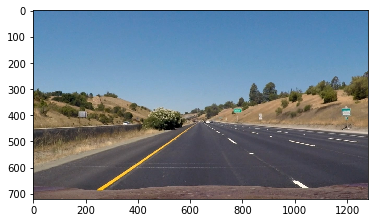

Undistort step output:


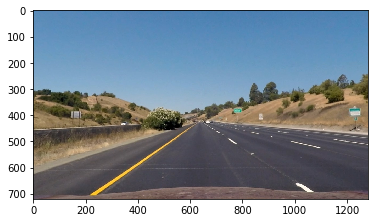

Binary Activation output:


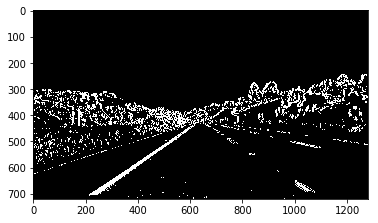

Region select pipe output:


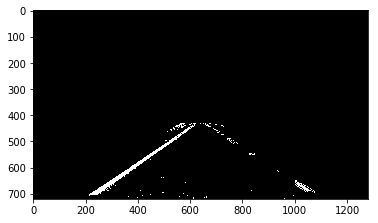

Warp Image output:


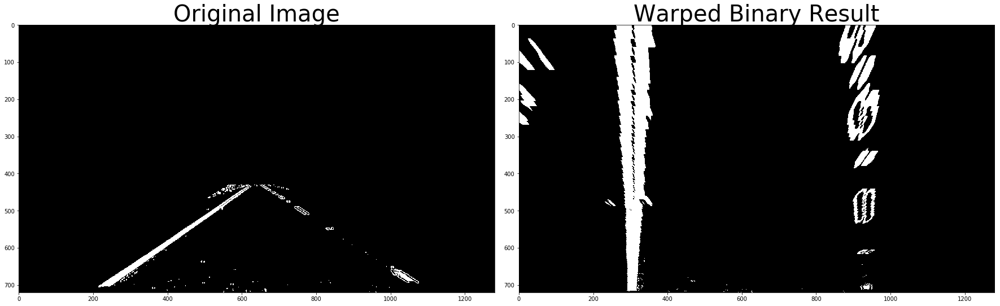

Fit Polynomial output:


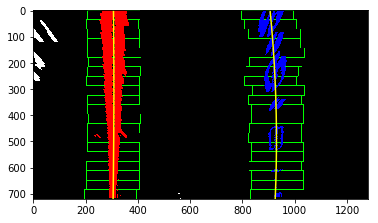

Search Lane With Prior Poly output:
center:  0.5955017221393701 m
9247.888014274167 m 1547.2206185295006 m


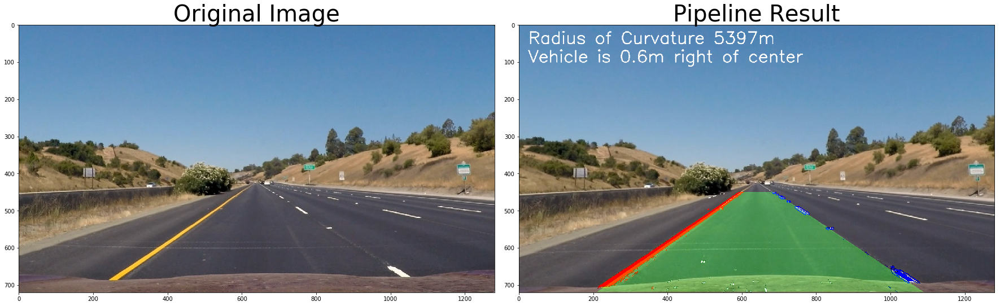

Test Image Original:


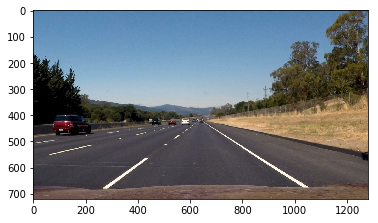

Undistort step output:


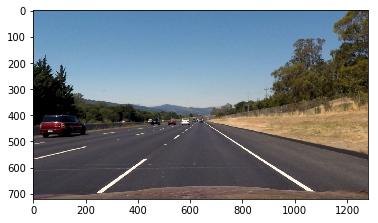

Binary Activation output:


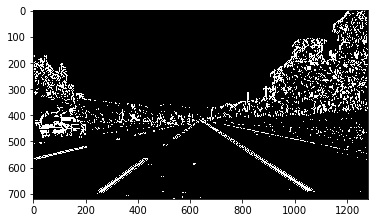

Region select pipe output:


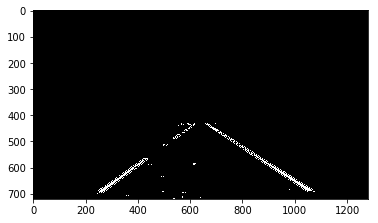

Warp Image output:


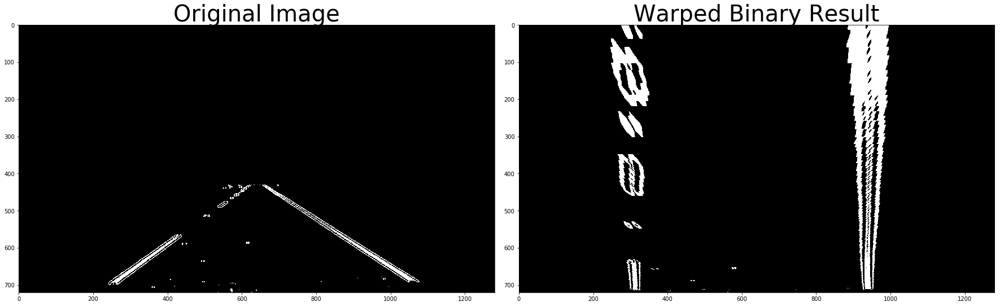

Fit Polynomial output:


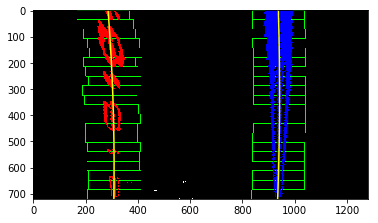

Search Lane With Prior Poly output:
center:  0.5606899752948102 m
2390.0267939842774 m 3324.3869438275033 m


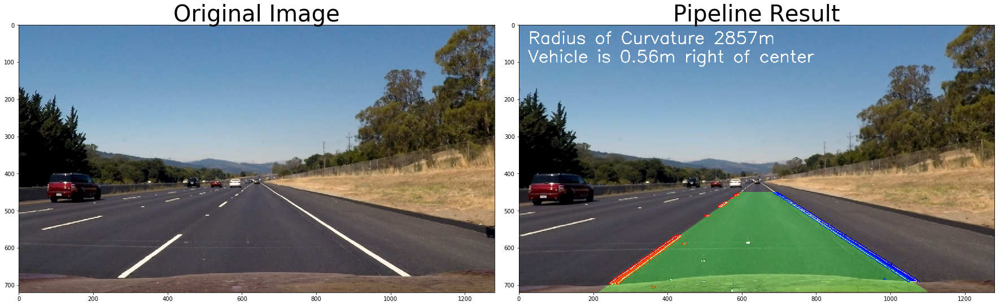

Test Image Original:


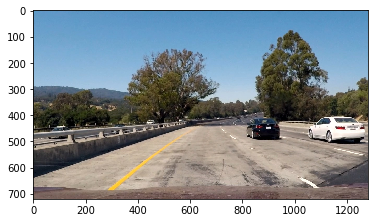

Undistort step output:


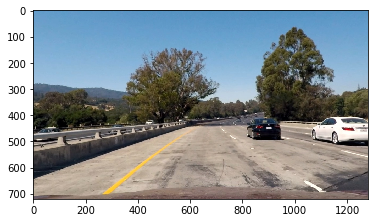

Binary Activation output:


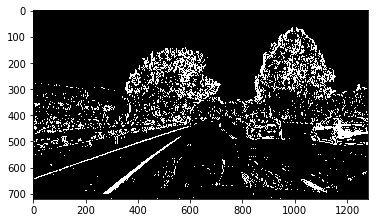

Region select pipe output:


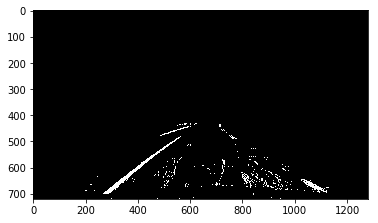

Warp Image output:


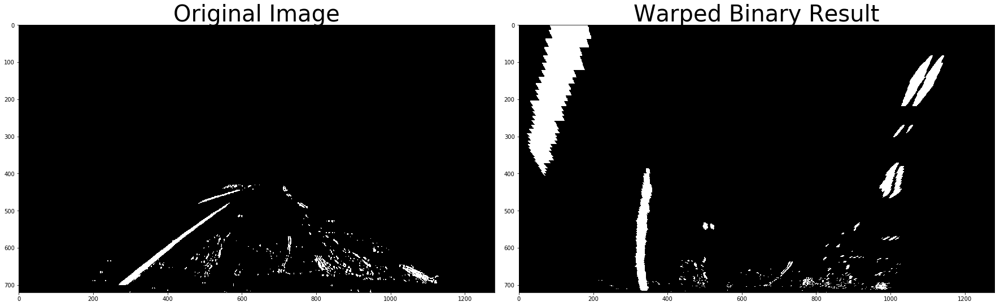

Fit Polynomial output:


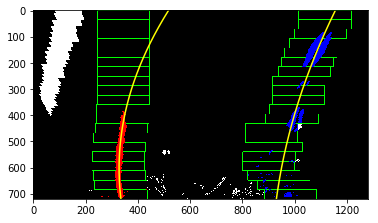

Search Lane With Prior Poly output:
center:  0.5183075391553862 m
311.08246682299057 m 1013.3316153240667 m


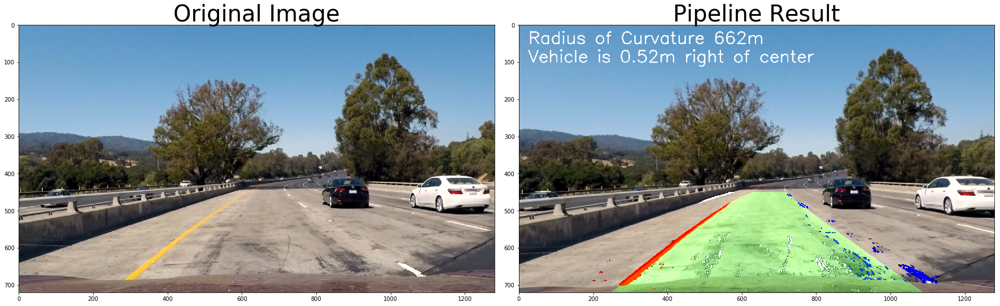

Test Image Original:


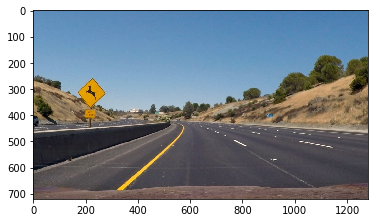

Undistort step output:


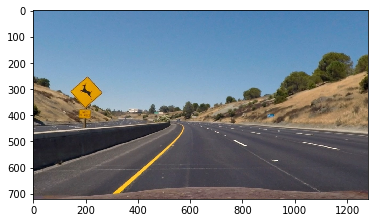

Binary Activation output:


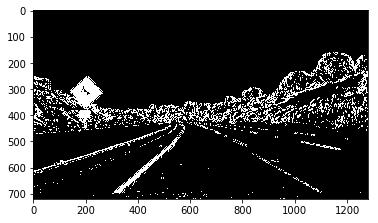

Region select pipe output:


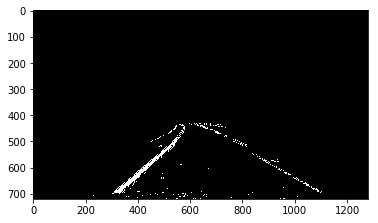

Warp Image output:


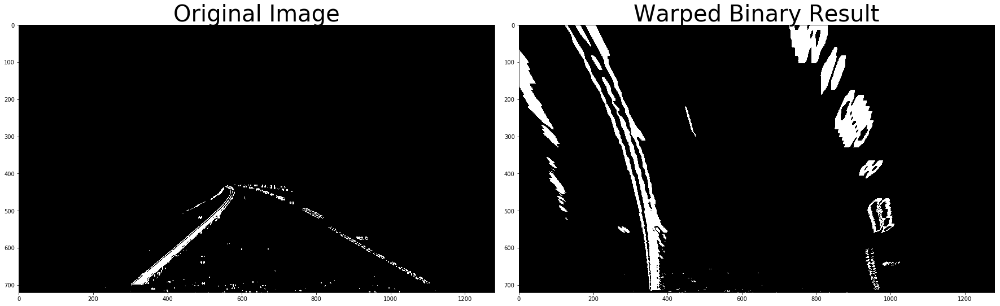

Fit Polynomial output:


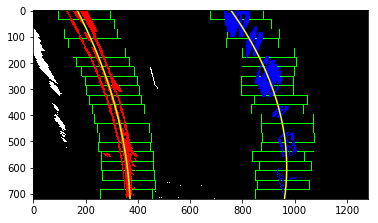

Search Lane With Prior Poly output:
center:  0.3086533509007019 m
473.92299448237736 m 258.98206509204385 m


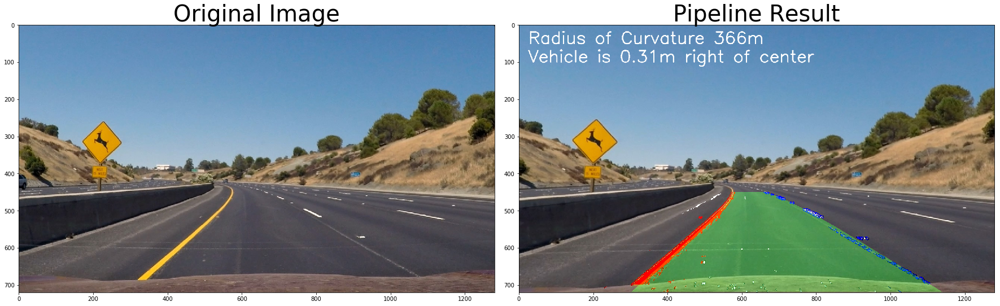

Test Image Original:


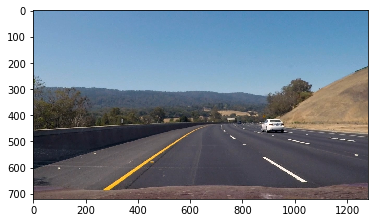

Undistort step output:


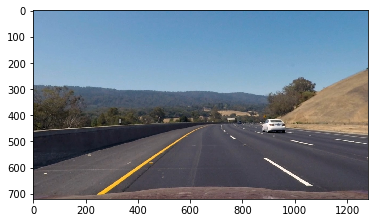

Binary Activation output:


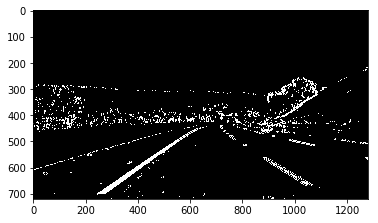

Region select pipe output:


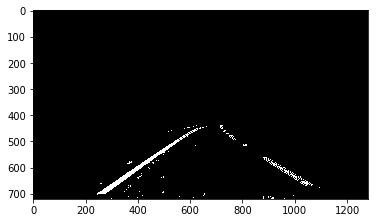

Warp Image output:


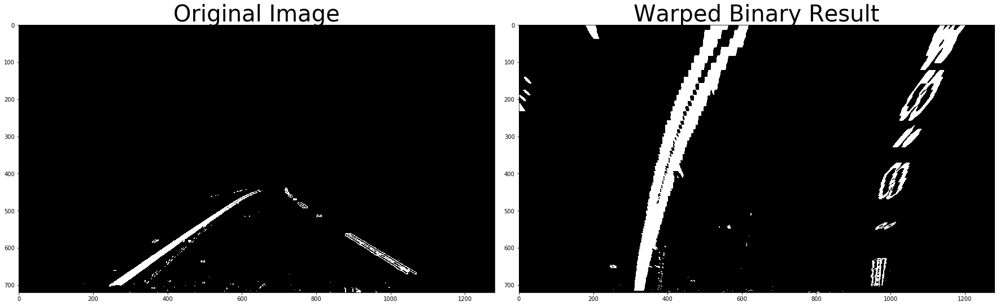

Fit Polynomial output:


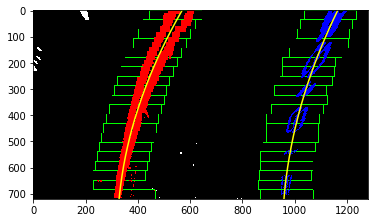

Search Lane With Prior Poly output:
center:  0.4364272610003006 m
464.56060031146234 m 541.2769678992919 m


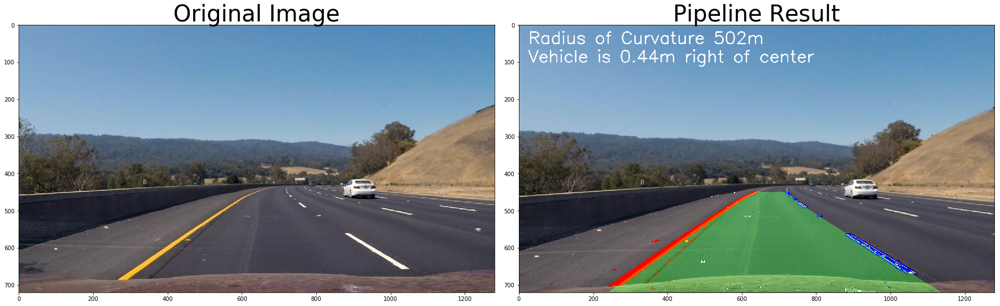

Test Image Original:


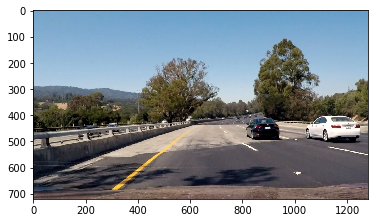

Undistort step output:


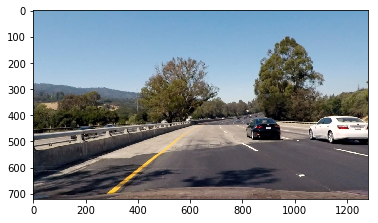

Binary Activation output:


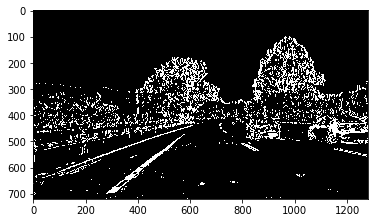

Region select pipe output:


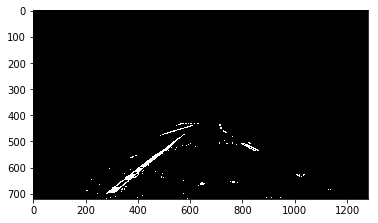

Warp Image output:


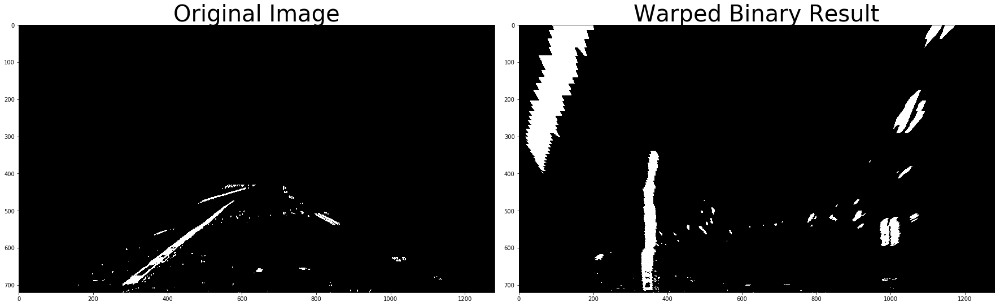

Fit Polynomial output:


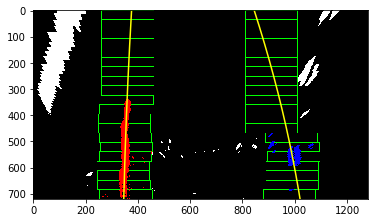

Search Lane With Prior Poly output:
center:  0.24173382408021293 m
4773.6364587899725 m 298.7733060155688 m


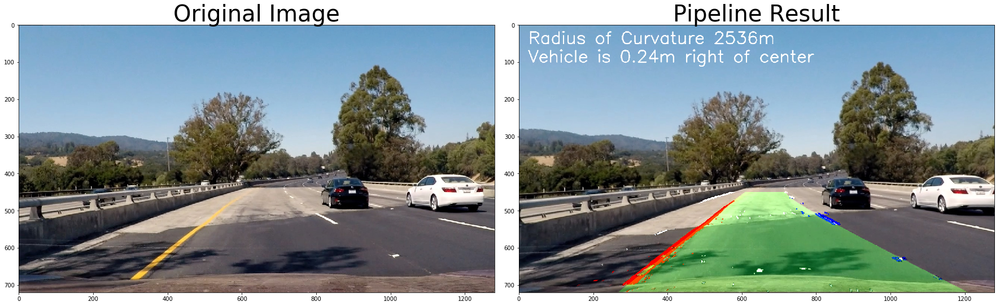

Test Image Original:


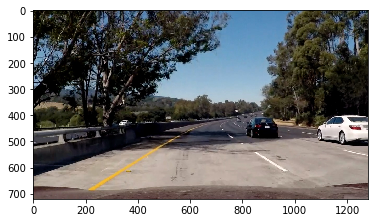

Undistort step output:


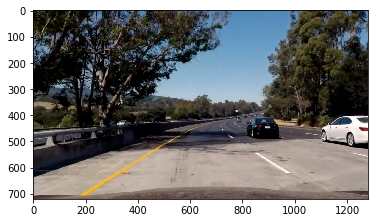

Binary Activation output:


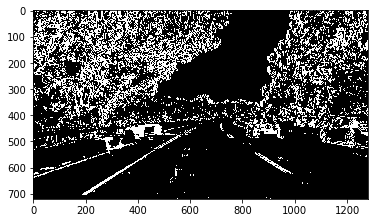

Region select pipe output:


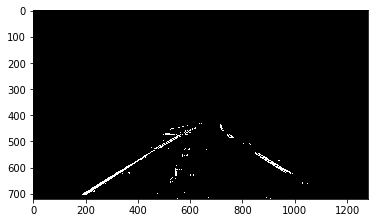

Warp Image output:


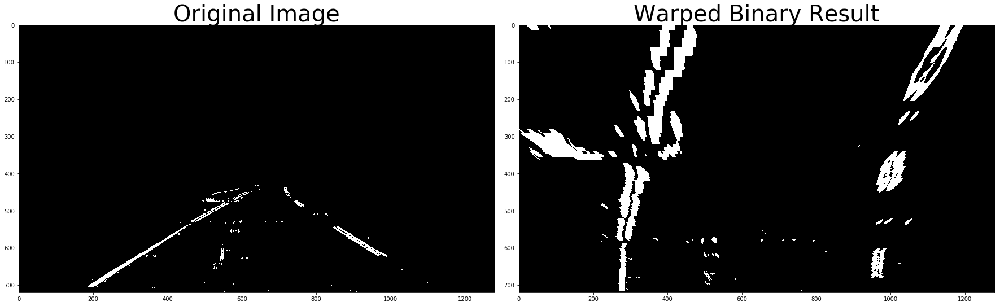

Fit Polynomial output:


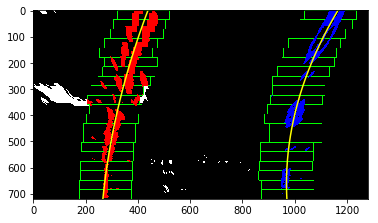

Search Lane With Prior Poly output:
center:  0.6027704116815173 m
1903.2625644836194 m 344.3661847516962 m


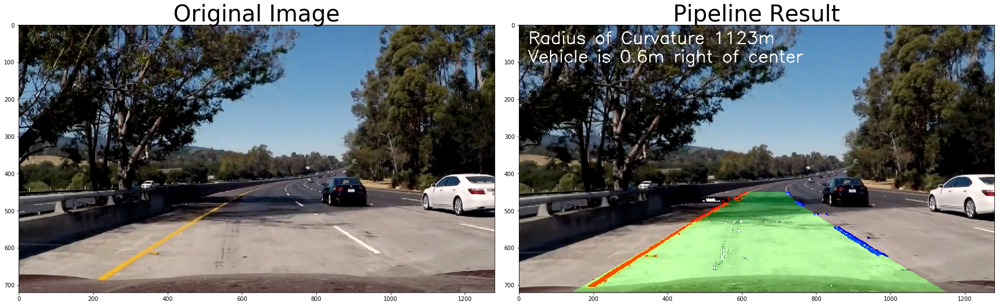

Test Image Original:


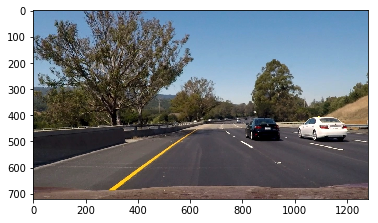

Undistort step output:


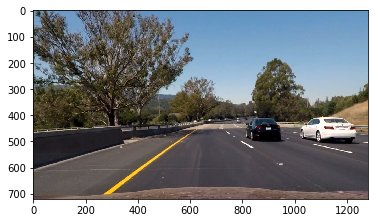

Binary Activation output:


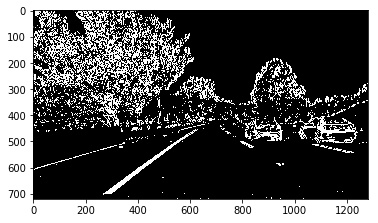

Region select pipe output:


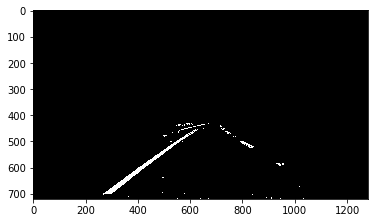

Warp Image output:


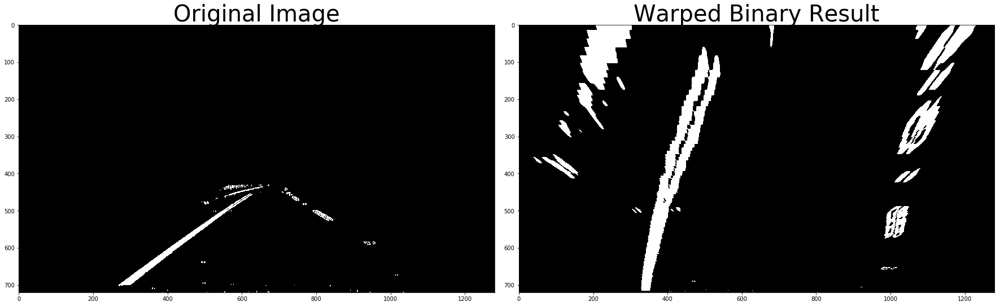

Fit Polynomial output:


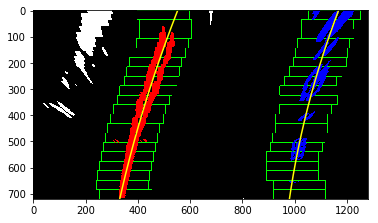

Search Lane With Prior Poly output:
center:  0.3678667675255025 m
1343.8903950206125 m 944.932504961065 m


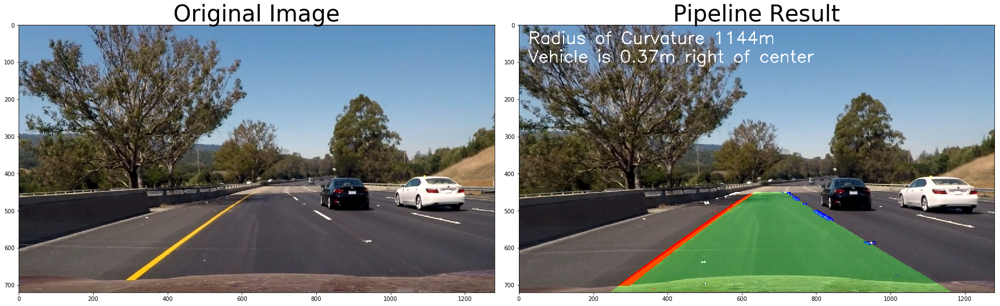

In [16]:
# Read Test Images
images = glob.glob('test_images/*.jpg')
DEBUG = True
lane_detected = False
left_lane_line = Line()
right_lane_line = Line()
for file in glob.glob('test_images/*jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    # Lane lines
    left_lane_line = Line()
    right_lane_line = Line()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, s_thresh=(170, 255), sx_thresh=(20, 100), debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)

    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    
    if right_lane_line.detected and right_lane_line.detected:
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        
        checkFit(left_lane_line, right_lane_line)
        
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
        
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
       
    plt.show()
    
    #Save results in file
    mpimg.imsave(file.replace("test", "output"), result)

In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

pygame 1.9.5
Hello from the pygame community. https://www.pygame.org/contribute.html


In [18]:
DEBUG = False
# Lane lines
left_lane_line = Line()
right_lane_line = Line()
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
        
    
       #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, s_thresh=(170, 255), sx_thresh=(20, 100), debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)

    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    lane_line_img = np.zeros_like(undistort_image)
    
    if right_lane_line.detected and left_lane_line.detected:
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
        checkFit(left_lane_line, right_lane_line)
    
    # For debugging
    narrow_search_worked = left_lane_line.detected or right_lane_line.detected
    reinitializing = False
    print(str(left_lane_line.radius_of_curvature)+' '+str(right_lane_line.radius_of_curvature))
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitializing = True
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
        left_lane_line.accept_fit()
        right_lane_line.accept_fit()
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
   
    #Debug Messages
    
    if narrow_search_worked:
        txt3 = "LL: Narrow Search Worked"
    elif not reinitializing:
        txt3 = "LL: Skipping frame"
    else:
        txt3 = "LL: Reinitializing fit"
    txt3 = txt3 + str(left_lane_line.radius_of_curvature)
    cv2.putText(result, txt3, (25,150), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    if narrow_search_worked:
        txt4 = "RL: Narrow Search Worked"
    elif not reinitializing:
        txt4 = "RL: Skipping frame"
    else:
        txt4 = "RL: Reinitializing fit"
    txt4 = txt4 + str(right_lane_line.radius_of_curvature)
    cv2.putText(result, txt4, (25,200), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
    return result

    

In [19]:
# clip1.reader.close()
# clip1.audio.reader.close_proc()
project_output_video = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("project_video.mp4")
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(project_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

None None
Moviepy - Building video output_images/project_video.mp4.
Moviepy - Writing video output_images/project_video.mp4



t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   0%|▏                                                                   | 3/1260 [00:00<01:05, 19.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   0%|▎                                                                   | 5/1260 [00:00<01:10, 17.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▍                                                                   | 7/1260 [00:00<01:14, 16.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▍                                                                   | 9/1260 [00:00<01:16, 16.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▌                                                                  | 11/1260 [00:00<01:18, 15.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▋                                                                  | 13/1260 [00:00<01:19, 15.69it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▊                                                                  | 15/1260 [00:00<01:19, 15.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▉                                                                  | 17/1260 [00:01<01:21, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█                                                                  | 19/1260 [00:01<01:21, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█                                                                  | 21/1260 [00:01<01:22, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▏                                                                 | 23/1260 [00:01<01:22, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▎                                                                 | 25/1260 [00:01<01:22, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▍                                                                 | 27/1260 [00:01<01:22, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▌                                                                 | 29/1260 [00:01<01:23, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▋                                                                 | 31/1260 [00:02<01:22, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▊                                                                 | 33/1260 [00:02<01:22, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▊                                                                 | 35/1260 [00:02<01:21, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▉                                                                 | 37/1260 [00:02<01:21, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██                                                                 | 39/1260 [00:02<01:21, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██▏                                                                | 41/1260 [00:02<01:21, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██▎                                                                | 43/1260 [00:02<01:21, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▍                                                                | 45/1260 [00:02<01:21, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▍                                                                | 47/1260 [00:03<01:22, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▌                                                                | 49/1260 [00:03<01:22, 14.75it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▋                                                                | 51/1260 [00:03<01:21, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▊                                                                | 53/1260 [00:03<01:21, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▉                                                                | 55/1260 [00:03<01:21, 14.75it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███                                                                | 57/1260 [00:03<01:22, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▏                                                               | 59/1260 [00:03<01:22, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▏                                                               | 61/1260 [00:04<01:21, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▎                                                               | 63/1260 [00:04<01:21, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▍                                                               | 65/1260 [00:04<01:20, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▌                                                               | 67/1260 [00:04<01:19, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▋                                                               | 69/1260 [00:04<01:19, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▊                                                               | 71/1260 [00:04<01:18, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▉                                                               | 73/1260 [00:04<01:19, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▉                                                               | 75/1260 [00:04<01:20, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████                                                               | 77/1260 [00:05<01:19, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████▏                                                              | 79/1260 [00:05<01:19, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████▎                                                              | 81/1260 [00:05<01:20, 14.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▍                                                              | 83/1260 [00:05<01:20, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▌                                                              | 85/1260 [00:05<01:20, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▋                                                              | 87/1260 [00:05<01:19, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▋                                                              | 89/1260 [00:05<01:19, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▊                                                              | 91/1260 [00:06<01:18, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▉                                                              | 93/1260 [00:06<01:17, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████                                                              | 95/1260 [00:06<01:18, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▏                                                             | 97/1260 [00:06<01:17, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▎                                                             | 99/1260 [00:06<01:17, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▎                                                            | 101/1260 [00:06<01:17, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▍                                                            | 103/1260 [00:06<01:17, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▌                                                            | 105/1260 [00:07<01:17, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▌                                                            | 107/1260 [00:07<01:17, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|█████▋                                                            | 109/1260 [00:07<01:16, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|█████▊                                                            | 111/1260 [00:07<01:18, 14.62it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|█████▉                                                            | 113/1260 [00:07<01:17, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████                                                            | 115/1260 [00:07<01:17, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████▏                                                           | 117/1260 [00:07<01:17, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████▏                                                           | 119/1260 [00:07<01:17, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▎                                                           | 121/1260 [00:08<01:17, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▍                                                           | 123/1260 [00:08<01:17, 14.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▌                                                           | 125/1260 [00:08<01:17, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▋                                                           | 127/1260 [00:08<01:17, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▊                                                           | 129/1260 [00:08<01:17, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▊                                                           | 131/1260 [00:08<01:17, 14.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|██████▉                                                           | 133/1260 [00:08<01:16, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████                                                           | 135/1260 [00:09<01:16, 14.63it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▏                                                          | 137/1260 [00:09<01:16, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▎                                                          | 139/1260 [00:09<01:15, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▍                                                          | 141/1260 [00:09<01:15, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▍                                                          | 143/1260 [00:09<01:15, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▌                                                          | 145/1260 [00:09<01:15, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▋                                                          | 147/1260 [00:09<01:15, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▊                                                          | 149/1260 [00:10<01:15, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▉                                                          | 151/1260 [00:10<01:14, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|████████                                                          | 153/1260 [00:10<01:13, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|████████                                                          | 155/1260 [00:10<01:13, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|████████▏                                                         | 157/1260 [00:10<01:13, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▎                                                         | 159/1260 [00:10<01:12, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▍                                                         | 161/1260 [00:10<01:13, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▌                                                         | 163/1260 [00:10<01:12, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▋                                                         | 165/1260 [00:11<01:12, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▋                                                         | 167/1260 [00:11<01:12, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▊                                                         | 169/1260 [00:11<01:12, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|████████▉                                                         | 171/1260 [00:11<01:12, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████                                                         | 173/1260 [00:11<01:11, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▏                                                        | 175/1260 [00:11<01:11, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▎                                                        | 177/1260 [00:11<01:12, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▍                                                        | 179/1260 [00:11<01:11, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▍                                                        | 181/1260 [00:12<01:10, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▌                                                        | 183/1260 [00:12<01:11, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▋                                                        | 185/1260 [00:12<01:10, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▊                                                        | 187/1260 [00:12<01:10, 15.19it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▉                                                        | 189/1260 [00:12<01:12, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████                                                        | 191/1260 [00:12<01:12, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████                                                        | 193/1260 [00:12<01:11, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████▏                                                       | 195/1260 [00:13<01:11, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▎                                                       | 197/1260 [00:13<01:11, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▍                                                       | 199/1260 [00:13<01:10, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▌                                                       | 201/1260 [00:13<01:11, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▋                                                       | 203/1260 [00:13<01:11, 14.75it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▋                                                       | 205/1260 [00:13<01:11, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▊                                                       | 207/1260 [00:13<01:12, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|██████████▉                                                       | 209/1260 [00:14<01:12, 14.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████                                                       | 211/1260 [00:14<01:11, 14.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▏                                                      | 213/1260 [00:14<01:12, 14.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▎                                                      | 215/1260 [00:14<01:11, 14.62it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▎                                                      | 217/1260 [00:14<01:10, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▍                                                      | 219/1260 [00:14<01:09, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▌                                                      | 221/1260 [00:14<01:09, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▋                                                      | 223/1260 [00:14<01:09, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▊                                                      | 225/1260 [00:15<01:09, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▉                                                      | 227/1260 [00:15<01:10, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▉                                                      | 229/1260 [00:15<01:09, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|████████████                                                      | 231/1260 [00:15<01:10, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|████████████▏                                                     | 233/1260 [00:15<01:08, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▎                                                     | 235/1260 [00:15<01:09, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▍                                                     | 237/1260 [00:15<01:08, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▌                                                     | 239/1260 [00:16<01:08, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▌                                                     | 241/1260 [00:16<01:09, 14.62it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▋                                                     | 243/1260 [00:16<01:09, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▊                                                     | 245/1260 [00:16<01:08, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|████████████▉                                                     | 247/1260 [00:16<01:08, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████                                                     | 249/1260 [00:16<01:06, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▏                                                    | 251/1260 [00:16<01:06, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▎                                                    | 253/1260 [00:16<01:05, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▎                                                    | 255/1260 [00:17<01:05, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▍                                                    | 257/1260 [00:17<01:06, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▌                                                    | 259/1260 [00:17<01:05, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▋                                                    | 261/1260 [00:17<01:07, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▊                                                    | 263/1260 [00:17<01:07, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▉                                                    | 265/1260 [00:17<01:06, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▉                                                    | 267/1260 [00:17<01:05, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|██████████████                                                    | 269/1260 [00:18<01:05, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▏                                                   | 271/1260 [00:18<01:05, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▎                                                   | 273/1260 [00:18<01:04, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▍                                                   | 275/1260 [00:18<01:04, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▌                                                   | 277/1260 [00:18<01:03, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▌                                                   | 279/1260 [00:18<01:04, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▋                                                   | 281/1260 [00:18<01:05, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▊                                                   | 283/1260 [00:18<01:04, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|██████████████▉                                                   | 285/1260 [00:19<01:04, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████                                                   | 287/1260 [00:19<01:04, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▏                                                  | 289/1260 [00:19<01:04, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▏                                                  | 291/1260 [00:19<01:04, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▎                                                  | 293/1260 [00:19<01:04, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▍                                                  | 295/1260 [00:19<01:03, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▌                                                  | 297/1260 [00:19<01:04, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▋                                                  | 299/1260 [00:20<01:04, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▊                                                  | 301/1260 [00:20<01:03, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▊                                                  | 303/1260 [00:20<01:03, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▉                                                  | 305/1260 [00:20<01:03, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|████████████████                                                  | 307/1260 [00:20<01:02, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▏                                                 | 309/1260 [00:20<01:03, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▎                                                 | 311/1260 [00:20<01:03, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▍                                                 | 313/1260 [00:20<01:04, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▌                                                 | 315/1260 [00:21<01:03, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▌                                                 | 317/1260 [00:21<01:03, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▋                                                 | 319/1260 [00:21<01:02, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▊                                                 | 321/1260 [00:21<01:02, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|████████████████▉                                                 | 323/1260 [00:21<01:02, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████                                                 | 325/1260 [00:21<01:02, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▏                                                | 327/1260 [00:21<01:02, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▏                                                | 329/1260 [00:22<01:01, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▎                                                | 331/1260 [00:22<01:02, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▍                                                | 333/1260 [00:22<01:02, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▌                                                | 335/1260 [00:22<01:01, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▋                                                | 337/1260 [00:22<01:01, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▊                                                | 339/1260 [00:22<01:00, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▊                                                | 341/1260 [00:22<01:00, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▉                                                | 343/1260 [00:22<00:59, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|██████████████████                                                | 345/1260 [00:23<00:59, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▏                                               | 347/1260 [00:23<00:59, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▎                                               | 349/1260 [00:23<00:59, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▍                                               | 351/1260 [00:23<00:59, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▍                                               | 353/1260 [00:23<00:58, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▌                                               | 355/1260 [00:23<00:59, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▋                                               | 357/1260 [00:23<00:58, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▊                                               | 359/1260 [00:23<00:59, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|██████████████████▉                                               | 361/1260 [00:24<01:00, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████                                               | 363/1260 [00:24<01:00, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████                                               | 365/1260 [00:24<00:59, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▏                                              | 367/1260 [00:24<00:59, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▎                                              | 369/1260 [00:24<00:59, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▍                                              | 371/1260 [00:24<00:59, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▌                                              | 373/1260 [00:24<00:58, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▋                                              | 375/1260 [00:25<00:58, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▋                                              | 377/1260 [00:25<00:58, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▊                                              | 379/1260 [00:25<00:57, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▉                                              | 381/1260 [00:25<00:57, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|████████████████████                                              | 383/1260 [00:25<00:57, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▏                                             | 385/1260 [00:25<00:57, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▎                                             | 387/1260 [00:25<00:56, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▍                                             | 389/1260 [00:25<00:56, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▍                                             | 391/1260 [00:26<00:56, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▌                                             | 393/1260 [00:26<00:56, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▋                                             | 395/1260 [00:26<00:56, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|████████████████████▊                                             | 397/1260 [00:26<00:57, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|████████████████████▉                                             | 399/1260 [00:26<00:56, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████                                             | 401/1260 [00:26<00:56, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████                                             | 403/1260 [00:26<00:56, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▏                                            | 405/1260 [00:27<00:56, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▎                                            | 407/1260 [00:27<00:57, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▍                                            | 409/1260 [00:27<00:56, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▌                                            | 411/1260 [00:27<00:55, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▋                                            | 413/1260 [00:27<00:55, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▋                                            | 415/1260 [00:27<00:55, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▊                                            | 417/1260 [00:27<00:56, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▉                                            | 419/1260 [00:27<00:55, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|██████████████████████                                            | 421/1260 [00:28<00:55, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▏                                           | 423/1260 [00:28<00:55, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▎                                           | 425/1260 [00:28<00:55, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▎                                           | 427/1260 [00:28<00:56, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▍                                           | 429/1260 [00:28<00:56, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▌                                           | 431/1260 [00:28<00:56, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▋                                           | 433/1260 [00:28<00:56, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|██████████████████████▊                                           | 435/1260 [00:29<00:55, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|██████████████████████▉                                           | 437/1260 [00:29<00:54, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|██████████████████████▉                                           | 439/1260 [00:29<00:53, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████                                           | 441/1260 [00:29<00:53, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▏                                          | 443/1260 [00:29<00:52, 15.44it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▎                                          | 445/1260 [00:29<00:52, 15.47it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▍                                          | 447/1260 [00:29<00:52, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▌                                          | 449/1260 [00:29<00:52, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▌                                          | 451/1260 [00:30<00:52, 15.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▋                                          | 453/1260 [00:30<00:52, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▊                                          | 455/1260 [00:30<00:51, 15.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▉                                          | 457/1260 [00:30<00:52, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|████████████████████████                                          | 459/1260 [00:30<00:53, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▏                                         | 461/1260 [00:30<00:52, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▎                                         | 463/1260 [00:30<00:53, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▎                                         | 465/1260 [00:31<00:53, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▍                                         | 467/1260 [00:31<00:52, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▌                                         | 469/1260 [00:31<00:52, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▋                                         | 471/1260 [00:31<00:51, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|████████████████████████▊                                         | 473/1260 [00:31<00:52, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|████████████████████████▉                                         | 475/1260 [00:31<00:52, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|████████████████████████▉                                         | 477/1260 [00:31<00:51, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████                                         | 479/1260 [00:31<00:52, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▏                                        | 481/1260 [00:32<00:51, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▎                                        | 483/1260 [00:32<00:51, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▍                                        | 485/1260 [00:32<00:51, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▌                                        | 487/1260 [00:32<00:51, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▌                                        | 489/1260 [00:32<00:50, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▋                                        | 491/1260 [00:32<00:51, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▊                                        | 493/1260 [00:32<00:51, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▉                                        | 495/1260 [00:32<00:51, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|██████████████████████████                                        | 497/1260 [00:33<00:50, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▏                                       | 499/1260 [00:33<00:50, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▏                                       | 501/1260 [00:33<00:50, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▎                                       | 503/1260 [00:33<00:50, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▍                                       | 505/1260 [00:33<00:50, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▌                                       | 507/1260 [00:33<00:49, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▋                                       | 509/1260 [00:33<00:49, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|██████████████████████████▊                                       | 511/1260 [00:34<00:49, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|██████████████████████████▊                                       | 513/1260 [00:34<00:49, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|██████████████████████████▉                                       | 515/1260 [00:34<00:50, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████                                       | 517/1260 [00:34<00:50, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▏                                      | 519/1260 [00:34<00:49, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▎                                      | 521/1260 [00:34<00:50, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▍                                      | 523/1260 [00:34<00:50, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▌                                      | 525/1260 [00:35<00:49, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▌                                      | 527/1260 [00:35<00:49, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▋                                      | 529/1260 [00:35<00:49, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▊                                      | 531/1260 [00:35<00:48, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▉                                      | 533/1260 [00:35<00:48, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|████████████████████████████                                      | 535/1260 [00:35<00:48, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▏                                     | 537/1260 [00:35<00:47, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▏                                     | 539/1260 [00:35<00:48, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▎                                     | 541/1260 [00:36<00:48, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▍                                     | 543/1260 [00:36<00:48, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▌                                     | 545/1260 [00:36<00:48, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▋                                     | 547/1260 [00:36<00:47, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|████████████████████████████▊                                     | 549/1260 [00:36<00:47, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|████████████████████████████▊                                     | 551/1260 [00:36<00:47, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|████████████████████████████▉                                     | 553/1260 [00:36<00:46, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████                                     | 555/1260 [00:37<00:46, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▏                                    | 557/1260 [00:37<00:48, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▎                                    | 559/1260 [00:37<00:48, 14.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▍                                    | 561/1260 [00:37<00:47, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▍                                    | 563/1260 [00:37<00:46, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▌                                    | 565/1260 [00:37<00:45, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▋                                    | 567/1260 [00:37<00:45, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▊                                    | 569/1260 [00:37<00:45, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▉                                    | 571/1260 [00:38<00:45, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|██████████████████████████████                                    | 573/1260 [00:38<00:45, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████                                    | 575/1260 [00:38<00:45, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▏                                   | 577/1260 [00:38<00:45, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▎                                   | 579/1260 [00:38<00:44, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▍                                   | 581/1260 [00:38<00:44, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▌                                   | 583/1260 [00:38<00:44, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▋                                   | 585/1260 [00:39<00:44, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|██████████████████████████████▋                                   | 587/1260 [00:39<00:44, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|██████████████████████████████▊                                   | 589/1260 [00:39<00:44, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|██████████████████████████████▉                                   | 591/1260 [00:39<00:44, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████                                   | 593/1260 [00:39<00:44, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████▏                                  | 595/1260 [00:39<00:44, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████▎                                  | 597/1260 [00:39<00:43, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▍                                  | 599/1260 [00:39<00:44, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▍                                  | 601/1260 [00:40<00:44, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▌                                  | 603/1260 [00:40<00:44, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▋                                  | 605/1260 [00:40<00:43, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▊                                  | 607/1260 [00:40<00:43, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▉                                  | 609/1260 [00:40<00:42, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|████████████████████████████████                                  | 611/1260 [00:40<00:42, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████                                  | 613/1260 [00:40<00:43, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▏                                 | 615/1260 [00:41<00:42, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▎                                 | 617/1260 [00:41<00:42, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▍                                 | 619/1260 [00:41<00:42, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▌                                 | 621/1260 [00:41<00:42, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▋                                 | 623/1260 [00:41<00:42, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|████████████████████████████████▋                                 | 625/1260 [00:41<00:41, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|████████████████████████████████▊                                 | 627/1260 [00:41<00:41, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|████████████████████████████████▉                                 | 629/1260 [00:41<00:42, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████                                 | 631/1260 [00:42<00:42, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████▏                                | 633/1260 [00:42<00:42, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████▎                                | 635/1260 [00:42<00:41, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▎                                | 637/1260 [00:42<00:40, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▍                                | 639/1260 [00:42<00:40, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▌                                | 641/1260 [00:42<00:41, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▋                                | 643/1260 [00:42<00:41, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▊                                | 645/1260 [00:42<00:41, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▉                                | 647/1260 [00:43<00:40, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|█████████████████████████████████▉                                | 649/1260 [00:43<00:40, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████                                | 651/1260 [00:43<00:40, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▏                               | 653/1260 [00:43<00:39, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▎                               | 655/1260 [00:43<00:39, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▍                               | 657/1260 [00:43<00:39, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▌                               | 659/1260 [00:43<00:38, 15.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▌                               | 661/1260 [00:44<00:38, 15.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|██████████████████████████████████▋                               | 663/1260 [00:44<00:38, 15.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|██████████████████████████████████▊                               | 665/1260 [00:44<00:38, 15.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|██████████████████████████████████▉                               | 667/1260 [00:44<00:38, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████                               | 669/1260 [00:44<00:38, 15.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▏                              | 671/1260 [00:44<00:38, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▎                              | 673/1260 [00:44<00:38, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▎                              | 675/1260 [00:44<00:37, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▍                              | 677/1260 [00:45<00:37, 15.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▌                              | 679/1260 [00:45<00:37, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▋                              | 681/1260 [00:45<00:38, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▊                              | 683/1260 [00:45<00:37, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▉                              | 685/1260 [00:45<00:37, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|███████████████████████████████████▉                              | 687/1260 [00:45<00:37, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████                              | 689/1260 [00:45<00:37, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▏                             | 691/1260 [00:45<00:37, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▎                             | 693/1260 [00:46<00:37, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▍                             | 695/1260 [00:46<00:37, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▌                             | 697/1260 [00:46<00:36, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▌                             | 699/1260 [00:46<00:37, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|████████████████████████████████████▋                             | 701/1260 [00:46<00:36, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|████████████████████████████████████▊                             | 703/1260 [00:46<00:36, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|████████████████████████████████████▉                             | 705/1260 [00:46<00:35, 15.44it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████                             | 707/1260 [00:47<00:35, 15.40it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████▏                            | 709/1260 [00:47<00:35, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████▏                            | 711/1260 [00:47<00:35, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▎                            | 713/1260 [00:47<00:35, 15.62it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▍                            | 715/1260 [00:47<00:35, 15.47it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▌                            | 717/1260 [00:47<00:35, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▋                            | 719/1260 [00:47<00:34, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▊                            | 721/1260 [00:47<00:34, 15.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▊                            | 723/1260 [00:48<00:34, 15.54it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|█████████████████████████████████████▉                            | 725/1260 [00:48<00:34, 15.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████                            | 727/1260 [00:48<00:34, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▏                           | 729/1260 [00:48<00:34, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▎                           | 731/1260 [00:48<00:35, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▍                           | 733/1260 [00:48<00:34, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▌                           | 735/1260 [00:48<00:34, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▌                           | 737/1260 [00:48<00:33, 15.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|██████████████████████████████████████▋                           | 739/1260 [00:49<00:33, 15.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|██████████████████████████████████████▊                           | 741/1260 [00:49<00:33, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|██████████████████████████████████████▉                           | 743/1260 [00:49<00:33, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████                           | 745/1260 [00:49<00:33, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████▏                          | 747/1260 [00:49<00:34, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████▏                          | 749/1260 [00:49<00:33, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▎                          | 751/1260 [00:49<00:33, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▍                          | 753/1260 [00:50<00:33, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▌                          | 755/1260 [00:50<00:33, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▋                          | 757/1260 [00:50<00:33, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▊                          | 759/1260 [00:50<00:33, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▊                          | 761/1260 [00:50<00:33, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|███████████████████████████████████████▉                          | 763/1260 [00:50<00:33, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████                          | 765/1260 [00:50<00:32, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▏                         | 767/1260 [00:50<00:32, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▎                         | 769/1260 [00:51<00:32, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▍                         | 771/1260 [00:51<00:32, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▍                         | 773/1260 [00:51<00:32, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▌                         | 775/1260 [00:51<00:32, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▋                         | 777/1260 [00:51<00:31, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▊                         | 779/1260 [00:51<00:31, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▉                         | 781/1260 [00:51<00:31, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████                         | 783/1260 [00:52<00:31, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████                         | 785/1260 [00:52<00:31, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████▏                        | 787/1260 [00:52<00:31, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▎                        | 789/1260 [00:52<00:31, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▍                        | 791/1260 [00:52<00:31, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▌                        | 793/1260 [00:52<00:30, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▋                        | 795/1260 [00:52<00:30, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▋                        | 797/1260 [00:52<00:31, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▊                        | 799/1260 [00:53<00:31, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|█████████████████████████████████████████▉                        | 801/1260 [00:53<00:31, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████                        | 803/1260 [00:53<00:31, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▏                       | 805/1260 [00:53<00:30, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▎                       | 807/1260 [00:53<00:29, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▍                       | 809/1260 [00:53<00:29, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▍                       | 811/1260 [00:53<00:29, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▌                       | 813/1260 [00:54<00:29, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▋                       | 815/1260 [00:54<00:29, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▊                       | 817/1260 [00:54<00:29, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▉                       | 819/1260 [00:54<00:29, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████                       | 821/1260 [00:54<00:29, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████                       | 823/1260 [00:54<00:28, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████▏                      | 825/1260 [00:54<00:28, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▎                      | 827/1260 [00:54<00:28, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▍                      | 829/1260 [00:55<00:28, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▌                      | 831/1260 [00:55<00:28, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▋                      | 833/1260 [00:55<00:27, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▋                      | 835/1260 [00:55<00:27, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▊                      | 837/1260 [00:55<00:27, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|███████████████████████████████████████████▉                      | 839/1260 [00:55<00:27, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████                      | 841/1260 [00:55<00:27, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▏                     | 843/1260 [00:55<00:27, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▎                     | 845/1260 [00:56<00:27, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▎                     | 847/1260 [00:56<00:27, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▍                     | 849/1260 [00:56<00:27, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▌                     | 851/1260 [00:56<00:26, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▋                     | 853/1260 [00:56<00:26, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▊                     | 855/1260 [00:56<00:26, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▉                     | 857/1260 [00:56<00:26, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▉                     | 859/1260 [00:57<00:26, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|█████████████████████████████████████████████                     | 861/1260 [00:57<00:26, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|█████████████████████████████████████████████▏                    | 863/1260 [00:57<00:26, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▎                    | 865/1260 [00:57<00:25, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▍                    | 867/1260 [00:57<00:26, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▌                    | 869/1260 [00:57<00:26, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▌                    | 871/1260 [00:57<00:25, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▋                    | 873/1260 [00:57<00:25, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▊                    | 875/1260 [00:58<00:25, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|█████████████████████████████████████████████▉                    | 877/1260 [00:58<00:25, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████                    | 879/1260 [00:58<00:25, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▏                   | 881/1260 [00:58<00:25, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▎                   | 883/1260 [00:58<00:24, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▎                   | 885/1260 [00:58<00:25, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▍                   | 887/1260 [00:58<00:25, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▌                   | 889/1260 [00:59<00:25, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▋                   | 891/1260 [00:59<00:24, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▊                   | 893/1260 [00:59<00:24, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▉                   | 895/1260 [00:59<00:24, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▉                   | 897/1260 [00:59<00:23, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|███████████████████████████████████████████████                   | 899/1260 [00:59<00:23, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▏                  | 901/1260 [00:59<00:23, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▎                  | 903/1260 [00:59<00:23, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▍                  | 905/1260 [01:00<00:23, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▌                  | 907/1260 [01:00<00:23, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▌                  | 909/1260 [01:00<00:23, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▋                  | 911/1260 [01:00<00:22, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▊                  | 913/1260 [01:00<00:22, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|███████████████████████████████████████████████▉                  | 915/1260 [01:00<00:22, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████                  | 917/1260 [01:00<00:22, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▏                 | 919/1260 [01:01<00:22, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▏                 | 921/1260 [01:01<00:22, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▎                 | 923/1260 [01:01<00:21, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▍                 | 925/1260 [01:01<00:21, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▌                 | 927/1260 [01:01<00:22, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▋                 | 929/1260 [01:01<00:21, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▊                 | 931/1260 [01:01<00:21, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▊                 | 933/1260 [01:01<00:21, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▉                 | 935/1260 [01:02<00:21, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|█████████████████████████████████████████████████                 | 937/1260 [01:02<00:21, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▏                | 939/1260 [01:02<00:21, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▎                | 941/1260 [01:02<00:20, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▍                | 943/1260 [01:02<00:20, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▌                | 945/1260 [01:02<00:20, 15.40it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▌                | 947/1260 [01:02<00:20, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▋                | 949/1260 [01:02<00:20, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▊                | 951/1260 [01:03<00:20, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|█████████████████████████████████████████████████▉                | 953/1260 [01:03<00:20, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████                | 955/1260 [01:03<00:19, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▏               | 957/1260 [01:03<00:19, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▏               | 959/1260 [01:03<00:19, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▎               | 961/1260 [01:03<00:19, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▍               | 963/1260 [01:03<00:19, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▌               | 965/1260 [01:04<00:19, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▋               | 967/1260 [01:04<00:19, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▊               | 969/1260 [01:04<00:19, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▊               | 971/1260 [01:04<00:19, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▉               | 973/1260 [01:04<00:19, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|███████████████████████████████████████████████████               | 975/1260 [01:04<00:19, 14.69it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▏              | 977/1260 [01:04<00:18, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▎              | 979/1260 [01:04<00:18, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▍              | 981/1260 [01:05<00:18, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▍              | 983/1260 [01:05<00:18, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▌              | 985/1260 [01:05<00:18, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▋              | 987/1260 [01:05<00:18, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▊              | 989/1260 [01:05<00:18, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|███████████████████████████████████████████████████▉              | 991/1260 [01:05<00:18, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████              | 993/1260 [01:05<00:17, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████              | 995/1260 [01:06<00:17, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▏             | 997/1260 [01:06<00:17, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▎             | 999/1260 [01:06<00:17, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|███████████████████████████████████████████████████▋             | 1001/1260 [01:06<00:16, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|███████████████████████████████████████████████████▋             | 1003/1260 [01:06<00:16, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|███████████████████████████████████████████████████▊             | 1005/1260 [01:06<00:16, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|███████████████████████████████████████████████████▉             | 1007/1260 [01:06<00:16, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████             | 1009/1260 [01:06<00:16, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████▏            | 1011/1260 [01:07<00:16, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████▎            | 1013/1260 [01:07<00:16, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|████████████████████████████████████████████████████▎            | 1015/1260 [01:07<00:16, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|████████████████████████████████████████████████████▍            | 1017/1260 [01:07<00:16, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|████████████████████████████████████████████████████▌            | 1019/1260 [01:07<00:16, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|████████████████████████████████████████████████████▋            | 1021/1260 [01:07<00:16, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|████████████████████████████████████████████████████▊            | 1023/1260 [01:07<00:16, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|████████████████████████████████████████████████████▉            | 1025/1260 [01:08<00:15, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|████████████████████████████████████████████████████▉            | 1027/1260 [01:08<00:16, 14.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████            | 1029/1260 [01:08<00:16, 14.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████▏           | 1031/1260 [01:08<00:15, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████▎           | 1033/1260 [01:08<00:15, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████▍           | 1035/1260 [01:08<00:15, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████▍           | 1037/1260 [01:08<00:15, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████▌           | 1039/1260 [01:08<00:14, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|█████████████████████████████████████████████████████▋           | 1041/1260 [01:09<00:14, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|█████████████████████████████████████████████████████▊           | 1043/1260 [01:09<00:14, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|█████████████████████████████████████████████████████▉           | 1045/1260 [01:09<00:14, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████           | 1047/1260 [01:09<00:14, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████           | 1049/1260 [01:09<00:13, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▏          | 1051/1260 [01:09<00:13, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▎          | 1053/1260 [01:09<00:13, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▍          | 1055/1260 [01:10<00:13, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▌          | 1057/1260 [01:10<00:13, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▋          | 1059/1260 [01:10<00:13, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▋          | 1061/1260 [01:10<00:13, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▊          | 1063/1260 [01:10<00:13, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|██████████████████████████████████████████████████████▉          | 1065/1260 [01:10<00:12, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████          | 1067/1260 [01:10<00:12, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▏         | 1069/1260 [01:10<00:12, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▎         | 1071/1260 [01:11<00:12, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▎         | 1073/1260 [01:11<00:12, 15.39it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▍         | 1075/1260 [01:11<00:12, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▌         | 1077/1260 [01:11<00:11, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▋         | 1079/1260 [01:11<00:11, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▊         | 1081/1260 [01:11<00:11, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▊         | 1083/1260 [01:11<00:11, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▉         | 1085/1260 [01:12<00:11, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|████████████████████████████████████████████████████████         | 1087/1260 [01:12<00:11, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|████████████████████████████████████████████████████████▏        | 1089/1260 [01:12<00:11, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▎        | 1091/1260 [01:12<00:11, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▍        | 1093/1260 [01:12<00:10, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▍        | 1095/1260 [01:12<00:10, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▌        | 1097/1260 [01:12<00:10, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▋        | 1099/1260 [01:12<00:10, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▊        | 1101/1260 [01:13<00:10, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|████████████████████████████████████████████████████████▉        | 1103/1260 [01:13<00:10, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████        | 1105/1260 [01:13<00:10, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████        | 1107/1260 [01:13<00:10, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▏       | 1109/1260 [01:13<00:10, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▎       | 1111/1260 [01:13<00:10, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▍       | 1113/1260 [01:13<00:09, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▌       | 1115/1260 [01:14<00:09, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▌       | 1117/1260 [01:14<00:09, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▋       | 1119/1260 [01:14<00:09, 14.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▊       | 1121/1260 [01:14<00:09, 14.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▉       | 1123/1260 [01:14<00:09, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|██████████████████████████████████████████████████████████       | 1125/1260 [01:14<00:09, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|██████████████████████████████████████████████████████████▏      | 1127/1260 [01:14<00:08, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▏      | 1129/1260 [01:14<00:08, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▎      | 1131/1260 [01:15<00:08, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▍      | 1133/1260 [01:15<00:08, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▌      | 1135/1260 [01:15<00:08, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▋      | 1137/1260 [01:15<00:08, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▊      | 1139/1260 [01:15<00:07, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|██████████████████████████████████████████████████████████▊      | 1141/1260 [01:15<00:07, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|██████████████████████████████████████████████████████████▉      | 1143/1260 [01:15<00:07, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████      | 1145/1260 [01:16<00:07, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▏     | 1147/1260 [01:16<00:07, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▎     | 1149/1260 [01:16<00:07, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▍     | 1151/1260 [01:16<00:07, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▍     | 1153/1260 [01:16<00:07, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▌     | 1155/1260 [01:16<00:06, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▋     | 1157/1260 [01:16<00:06, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▊     | 1159/1260 [01:16<00:06, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▉     | 1161/1260 [01:17<00:06, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▉     | 1163/1260 [01:17<00:06, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|████████████████████████████████████████████████████████████     | 1165/1260 [01:17<00:06, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▏    | 1167/1260 [01:17<00:06, 14.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▎    | 1169/1260 [01:17<00:06, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▍    | 1171/1260 [01:17<00:06, 14.44it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▌    | 1173/1260 [01:17<00:05, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▌    | 1175/1260 [01:18<00:05, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▋    | 1177/1260 [01:18<00:05, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|████████████████████████████████████████████████████████████▊    | 1179/1260 [01:18<00:05, 14.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|████████████████████████████████████████████████████████████▉    | 1181/1260 [01:18<00:05, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████    | 1183/1260 [01:18<00:05, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████▏   | 1185/1260 [01:18<00:05, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████▏   | 1187/1260 [01:18<00:04, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████▎   | 1189/1260 [01:18<00:04, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▍   | 1191/1260 [01:19<00:04, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▌   | 1193/1260 [01:19<00:04, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▋   | 1195/1260 [01:19<00:04, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▊   | 1197/1260 [01:19<00:04, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▊   | 1199/1260 [01:19<00:04, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▉   | 1201/1260 [01:19<00:03, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|██████████████████████████████████████████████████████████████   | 1203/1260 [01:19<00:03, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▏  | 1205/1260 [01:20<00:03, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▎  | 1207/1260 [01:20<00:03, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▎  | 1209/1260 [01:20<00:03, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▍  | 1211/1260 [01:20<00:03, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▌  | 1213/1260 [01:20<00:03, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▋  | 1215/1260 [01:20<00:02, 15.45it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|██████████████████████████████████████████████████████████████▊  | 1217/1260 [01:20<00:02, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|██████████████████████████████████████████████████████████████▉  | 1219/1260 [01:20<00:02, 15.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|██████████████████████████████████████████████████████████████▉  | 1221/1260 [01:21<00:02, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████  | 1223/1260 [01:21<00:02, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████▏ | 1225/1260 [01:21<00:02, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████▎ | 1227/1260 [01:21<00:02, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▍ | 1229/1260 [01:21<00:02, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▌ | 1231/1260 [01:21<00:01, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▌ | 1233/1260 [01:21<00:01, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▋ | 1235/1260 [01:22<00:01, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▊ | 1237/1260 [01:22<00:01, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▉ | 1239/1260 [01:22<00:01, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|████████████████████████████████████████████████████████████████ | 1241/1260 [01:22<00:01, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████ | 1243/1260 [01:22<00:01, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▏| 1245/1260 [01:22<00:00, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▎| 1247/1260 [01:22<00:00, 15.45it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▍| 1249/1260 [01:22<00:00, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▌| 1251/1260 [01:23<00:00, 15.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▋| 1253/1260 [01:23<00:00, 15.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|████████████████████████████████████████████████████████████████▋| 1255/1260 [01:23<00:00, 15.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|████████████████████████████████████████████████████████████████▊| 1257/1260 [01:23<00:00, 15.54it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|████████████████████████████████████████████████████████████████▉| 1259/1260 [01:23<00:00, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


Moviepy - Done !
Moviepy - video ready output_images/project_video.mp4
Wall time: 1min 24s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output_video))

In [21]:
challenge_output_video = 'output_images/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("challenge_video.mp4")
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

363.3363361165181 1245.0232130774025
Moviepy - Building video output_images/challenge_video.mp4.
Moviepy - Writing video output_images/challenge_video.mp4



t:   0%|                                                                             | 0/485 [00:00<?, ?it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▍                                                                    | 3/485 [00:00<00:20, 23.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▋                                                                    | 5/485 [00:00<00:24, 19.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▉                                                                    | 7/485 [00:00<00:26, 18.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▎                                                                   | 9/485 [00:00<00:27, 17.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▌                                                                  | 11/485 [00:00<00:28, 16.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▊                                                                  | 13/485 [00:00<00:29, 16.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██                                                                  | 15/485 [00:00<00:30, 15.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▍                                                                 | 17/485 [00:01<00:30, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▋                                                                 | 19/485 [00:01<00:29, 15.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▉                                                                 | 21/485 [00:01<00:29, 15.63it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▏                                                                | 23/485 [00:01<00:30, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▌                                                                | 25/485 [00:01<00:31, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▊                                                                | 27/485 [00:01<00:30, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████                                                                | 29/485 [00:01<00:30, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████▎                                                               | 31/485 [00:01<00:29, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▋                                                               | 33/485 [00:02<00:30, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▉                                                               | 35/485 [00:02<00:29, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▏                                                              | 37/485 [00:02<00:29, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▍                                                              | 39/485 [00:02<00:29, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▋                                                              | 41/485 [00:02<00:29, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████                                                              | 43/485 [00:02<00:29, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████▎                                                             | 45/485 [00:02<00:29, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▌                                                             | 47/485 [00:03<00:29, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▊                                                             | 49/485 [00:03<00:29, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▏                                                            | 51/485 [00:03<00:29, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▍                                                            | 53/485 [00:03<00:29, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▋                                                            | 55/485 [00:03<00:28, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▉                                                            | 57/485 [00:03<00:28, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|████████▎                                                           | 59/485 [00:03<00:28, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▌                                                           | 61/485 [00:03<00:28, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▊                                                           | 63/485 [00:04<00:27, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|█████████                                                           | 65/485 [00:04<00:27, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▍                                                          | 67/485 [00:04<00:27, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▋                                                          | 69/485 [00:04<00:27, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▉                                                          | 71/485 [00:04<00:26, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████▏                                                         | 73/485 [00:04<00:26, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████▌                                                         | 75/485 [00:04<00:27, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▊                                                         | 77/485 [00:05<00:26, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|███████████                                                         | 79/485 [00:05<00:26, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▎                                                        | 81/485 [00:05<00:27, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▋                                                        | 83/485 [00:05<00:26, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▉                                                        | 85/485 [00:05<00:26, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|████████████▏                                                       | 87/485 [00:05<00:26, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|████████████▍                                                       | 89/485 [00:05<00:25, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▊                                                       | 91/485 [00:05<00:25, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|█████████████                                                       | 93/485 [00:06<00:24, 15.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▎                                                      | 95/485 [00:06<00:24, 15.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▌                                                      | 97/485 [00:06<00:24, 15.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▉                                                      | 99/485 [00:06<00:25, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▉                                                     | 101/485 [00:06<00:24, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|██████████████▏                                                    | 103/485 [00:06<00:24, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▌                                                    | 105/485 [00:06<00:24, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▊                                                    | 107/485 [00:06<00:24, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|███████████████                                                    | 109/485 [00:07<00:24, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▎                                                   | 111/485 [00:07<00:24, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▌                                                   | 113/485 [00:07<00:24, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▉                                                   | 115/485 [00:07<00:24, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|████████████████▏                                                  | 117/485 [00:07<00:24, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▍                                                  | 119/485 [00:07<00:23, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▋                                                  | 121/485 [00:07<00:23, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▉                                                  | 123/485 [00:08<00:23, 15.40it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▎                                                 | 125/485 [00:08<00:23, 15.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▌                                                 | 127/485 [00:08<00:23, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▊                                                 | 129/485 [00:08<00:23, 15.45it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|██████████████████                                                 | 131/485 [00:08<00:23, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|██████████████████▎                                                | 133/485 [00:08<00:22, 15.47it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▋                                                | 135/485 [00:08<00:22, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▉                                                | 137/485 [00:08<00:23, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▏                                               | 139/485 [00:09<00:23, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▍                                               | 141/485 [00:09<00:23, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▊                                               | 143/485 [00:09<00:22, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|████████████████████                                               | 145/485 [00:09<00:22, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|████████████████████▎                                              | 147/485 [00:09<00:22, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▌                                              | 149/485 [00:09<00:22, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▊                                              | 151/485 [00:09<00:22, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▏                                             | 153/485 [00:10<00:22, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▍                                             | 155/485 [00:10<00:21, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▋                                             | 157/485 [00:10<00:21, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▉                                             | 159/485 [00:10<00:21, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|██████████████████████▏                                            | 161/485 [00:10<00:21, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▌                                            | 163/485 [00:10<00:21, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▊                                            | 165/485 [00:10<00:20, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|███████████████████████                                            | 167/485 [00:10<00:21, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▎                                           | 169/485 [00:11<00:21, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▌                                           | 171/485 [00:11<00:20, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▉                                           | 173/485 [00:11<00:20, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|████████████████████████▏                                          | 175/485 [00:11<00:20, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|████████████████████████▍                                          | 177/485 [00:11<00:20, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▋                                          | 179/485 [00:11<00:19, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|█████████████████████████                                          | 181/485 [00:11<00:19, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▎                                         | 183/485 [00:11<00:19, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▌                                         | 185/485 [00:12<00:19, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▊                                         | 187/485 [00:12<00:19, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|██████████████████████████                                         | 189/485 [00:12<00:19, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|██████████████████████████▍                                        | 191/485 [00:12<00:19, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▋                                        | 193/485 [00:12<00:19, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▉                                        | 195/485 [00:12<00:19, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▏                                       | 197/485 [00:12<00:18, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▍                                       | 199/485 [00:13<00:18, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▊                                       | 201/485 [00:13<00:18, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|████████████████████████████                                       | 203/485 [00:13<00:18, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|████████████████████████████▎                                      | 205/485 [00:13<00:18, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▌                                      | 207/485 [00:13<00:18, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▊                                      | 209/485 [00:13<00:17, 15.54it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▏                                     | 211/485 [00:13<00:17, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▍                                     | 213/485 [00:13<00:17, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▋                                     | 215/485 [00:14<00:17, 15.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▉                                     | 217/485 [00:14<00:17, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|██████████████████████████████▎                                    | 219/485 [00:14<00:17, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▌                                    | 221/485 [00:14<00:17, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▊                                    | 223/485 [00:14<00:17, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|███████████████████████████████                                    | 225/485 [00:14<00:16, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████▎                                   | 227/485 [00:14<00:16, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████▋                                   | 229/485 [00:14<00:16, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▉                                   | 231/485 [00:15<00:16, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|████████████████████████████████▏                                  | 233/485 [00:15<00:16, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|████████████████████████████████▍                                  | 235/485 [00:15<00:16, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▋                                  | 237/485 [00:15<00:16, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|█████████████████████████████████                                  | 239/485 [00:15<00:16, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████▎                                 | 241/485 [00:15<00:15, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████▌                                 | 243/485 [00:15<00:15, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▊                                 | 245/485 [00:16<00:15, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|██████████████████████████████████                                 | 247/485 [00:16<00:15, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|██████████████████████████████████▍                                | 249/485 [00:16<00:15, 15.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▋                                | 251/485 [00:16<00:15, 15.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▉                                | 253/485 [00:16<00:14, 15.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▏                               | 255/485 [00:16<00:14, 15.62it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▌                               | 257/485 [00:16<00:14, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▊                               | 259/485 [00:16<00:14, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|████████████████████████████████████                               | 261/485 [00:17<00:14, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|████████████████████████████████████▎                              | 263/485 [00:17<00:14, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▌                              | 265/485 [00:17<00:14, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▉                              | 267/485 [00:17<00:14, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|█████████████████████████████████████▏                             | 269/485 [00:17<00:14, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████▍                             | 271/485 [00:17<00:13, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████▋                             | 273/485 [00:17<00:13, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▉                             | 275/485 [00:18<00:14, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|██████████████████████████████████████▎                            | 277/485 [00:18<00:14, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▌                            | 279/485 [00:18<00:13, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▊                            | 281/485 [00:18<00:13, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|███████████████████████████████████████                            | 283/485 [00:18<00:13, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████▎                           | 285/485 [00:18<00:13, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████▋                           | 287/485 [00:18<00:12, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▉                           | 289/485 [00:18<00:12, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|████████████████████████████████████████▏                          | 291/485 [00:19<00:12, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|████████████████████████████████████████▍                          | 293/485 [00:19<00:12, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▊                          | 295/485 [00:19<00:12, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|█████████████████████████████████████████                          | 297/485 [00:19<00:12, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████▎                         | 299/485 [00:19<00:12, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████▌                         | 301/485 [00:19<00:12, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████▊                         | 303/485 [00:19<00:12, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|██████████████████████████████████████████▏                        | 305/485 [00:19<00:11, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|██████████████████████████████████████████▍                        | 307/485 [00:20<00:11, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▋                        | 309/485 [00:20<00:11, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▉                        | 311/485 [00:20<00:11, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████▏                       | 313/485 [00:20<00:11, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████▌                       | 315/485 [00:20<00:11, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████▊                       | 317/485 [00:20<00:10, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|████████████████████████████████████████████                       | 319/485 [00:20<00:10, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|████████████████████████████████████████████▎                      | 321/485 [00:21<00:10, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▌                      | 323/485 [00:21<00:10, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▉                      | 325/485 [00:21<00:10, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|█████████████████████████████████████████████▏                     | 327/485 [00:21<00:10, 15.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|█████████████████████████████████████████████▍                     | 329/485 [00:21<00:09, 15.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|█████████████████████████████████████████████▋                     | 331/485 [00:21<00:09, 15.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|██████████████████████████████████████████████                     | 333/485 [00:21<00:09, 15.63it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|██████████████████████████████████████████████▎                    | 335/485 [00:21<00:09, 15.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|██████████████████████████████████████████████▌                    | 337/485 [00:22<00:09, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▊                    | 339/485 [00:22<00:09, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|███████████████████████████████████████████████                    | 341/485 [00:22<00:09, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|███████████████████████████████████████████████▍                   | 343/485 [00:22<00:09, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|███████████████████████████████████████████████▋                   | 345/485 [00:22<00:09, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▉                   | 347/485 [00:22<00:09, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|████████████████████████████████████████████████▏                  | 349/485 [00:22<00:08, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|████████████████████████████████████████████████▍                  | 351/485 [00:22<00:08, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▊                  | 353/485 [00:23<00:08, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|█████████████████████████████████████████████████                  | 355/485 [00:23<00:08, 15.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|█████████████████████████████████████████████████▎                 | 357/485 [00:23<00:08, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|█████████████████████████████████████████████████▌                 | 359/485 [00:23<00:08, 15.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|█████████████████████████████████████████████████▊                 | 361/485 [00:23<00:07, 15.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|██████████████████████████████████████████████████▏                | 363/485 [00:23<00:07, 15.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|██████████████████████████████████████████████████▍                | 365/485 [00:23<00:07, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▋                | 367/485 [00:24<00:07, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▉                | 369/485 [00:24<00:07, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|███████████████████████████████████████████████████▎               | 371/485 [00:24<00:07, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|███████████████████████████████████████████████████▌               | 373/485 [00:24<00:07, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|███████████████████████████████████████████████████▊               | 375/485 [00:24<00:07, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|████████████████████████████████████████████████████               | 377/485 [00:24<00:07, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|████████████████████████████████████████████████████▎              | 379/485 [00:24<00:07, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▋              | 381/485 [00:24<00:06, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▉              | 383/485 [00:25<00:06, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|█████████████████████████████████████████████████████▏             | 385/485 [00:25<00:06, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|█████████████████████████████████████████████████████▍             | 387/485 [00:25<00:06, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|█████████████████████████████████████████████████████▋             | 389/485 [00:25<00:06, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|██████████████████████████████████████████████████████             | 391/485 [00:25<00:06, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|██████████████████████████████████████████████████████▎            | 393/485 [00:25<00:06, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|██████████████████████████████████████████████████████▌            | 395/485 [00:25<00:05, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|██████████████████████████████████████████████████████▊            | 397/485 [00:26<00:06, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|███████████████████████████████████████████████████████            | 399/485 [00:26<00:05, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|███████████████████████████████████████████████████████▍           | 401/485 [00:26<00:05, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|███████████████████████████████████████████████████████▋           | 403/485 [00:26<00:05, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|███████████████████████████████████████████████████████▉           | 405/485 [00:26<00:05, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|████████████████████████████████████████████████████████▏          | 407/485 [00:26<00:05, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|████████████████████████████████████████████████████████▌          | 409/485 [00:26<00:05, 15.19it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|████████████████████████████████████████████████████████▊          | 411/485 [00:26<00:04, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|█████████████████████████████████████████████████████████          | 413/485 [00:27<00:04, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|█████████████████████████████████████████████████████████▎         | 415/485 [00:27<00:04, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|█████████████████████████████████████████████████████████▌         | 417/485 [00:27<00:04, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|█████████████████████████████████████████████████████████▉         | 419/485 [00:27<00:04, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|██████████████████████████████████████████████████████████▏        | 421/485 [00:27<00:04, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|██████████████████████████████████████████████████████████▍        | 423/485 [00:27<00:04, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|██████████████████████████████████████████████████████████▋        | 425/485 [00:27<00:03, 15.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|██████████████████████████████████████████████████████████▉        | 427/485 [00:27<00:03, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|███████████████████████████████████████████████████████████▎       | 429/485 [00:28<00:03, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|███████████████████████████████████████████████████████████▌       | 431/485 [00:28<00:03, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|███████████████████████████████████████████████████████████▊       | 433/485 [00:28<00:03, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|████████████████████████████████████████████████████████████       | 435/485 [00:28<00:03, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|████████████████████████████████████████████████████████████▎      | 437/485 [00:28<00:03, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|████████████████████████████████████████████████████████████▋      | 439/485 [00:28<00:03, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|████████████████████████████████████████████████████████████▉      | 441/485 [00:28<00:02, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|█████████████████████████████████████████████████████████████▏     | 443/485 [00:29<00:02, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|█████████████████████████████████████████████████████████████▍     | 445/485 [00:29<00:02, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|█████████████████████████████████████████████████████████████▊     | 447/485 [00:29<00:02, 15.19it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|██████████████████████████████████████████████████████████████     | 449/485 [00:29<00:02, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|██████████████████████████████████████████████████████████████▎    | 451/485 [00:29<00:02, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|██████████████████████████████████████████████████████████████▌    | 453/485 [00:29<00:02, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|██████████████████████████████████████████████████████████████▊    | 455/485 [00:29<00:01, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|███████████████████████████████████████████████████████████████▏   | 457/485 [00:29<00:01, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|███████████████████████████████████████████████████████████████▍   | 459/485 [00:30<00:01, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|███████████████████████████████████████████████████████████████▋   | 461/485 [00:30<00:01, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|███████████████████████████████████████████████████████████████▉   | 463/485 [00:30<00:01, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|████████████████████████████████████████████████████████████████▏  | 465/485 [00:30<00:01, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|████████████████████████████████████████████████████████████████▌  | 467/485 [00:30<00:01, 15.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|████████████████████████████████████████████████████████████████▊  | 469/485 [00:30<00:01, 15.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|█████████████████████████████████████████████████████████████████  | 471/485 [00:30<00:00, 15.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|█████████████████████████████████████████████████████████████████▎ | 473/485 [00:31<00:00, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|█████████████████████████████████████████████████████████████████▌ | 475/485 [00:31<00:00, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|█████████████████████████████████████████████████████████████████▉ | 477/485 [00:31<00:00, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|██████████████████████████████████████████████████████████████████▏| 479/485 [00:31<00:00, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|██████████████████████████████████████████████████████████████████▍| 481/485 [00:31<00:00, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|██████████████████████████████████████████████████████████████████▋| 483/485 [00:31<00:00, 15.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|███████████████████████████████████████████████████████████████████| 485/485 [00:31<00:00, 15.39it/s, now=None]

363.3363361165181 1245.0232130774025


Moviepy - Done !
Moviepy - video ready output_images/challenge_video.mp4
Wall time: 32.1 s


In [22]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(challenge_output_video))

In [23]:
harder_challenge_output_video = 'output_images/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("harder_challenge_video.mp4")
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(harder_challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

363.3363361165181 1245.0232130774025
Moviepy - Building video output_images/harder_challenge_video.mp4.
Moviepy - Writing video output_images/harder_challenge_video.mp4



t:   0%|                                                                            | 0/1199 [00:00<?, ?it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   0%|▏                                                                   | 3/1199 [00:00<00:56, 21.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   0%|▎                                                                   | 5/1199 [00:00<01:03, 18.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▍                                                                   | 7/1199 [00:00<01:08, 17.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▌                                                                   | 9/1199 [00:00<01:13, 16.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▌                                                                  | 11/1199 [00:00<01:15, 15.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▋                                                                  | 13/1199 [00:00<01:18, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▊                                                                  | 15/1199 [00:00<01:18, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   1%|▉                                                                  | 17/1199 [00:01<01:18, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█                                                                  | 19/1199 [00:01<01:19, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▏                                                                 | 21/1199 [00:01<01:19, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▎                                                                 | 23/1199 [00:01<01:19, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▍                                                                 | 25/1199 [00:01<01:19, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▌                                                                 | 27/1199 [00:01<01:20, 14.47it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   2%|█▌                                                                 | 29/1199 [00:01<01:20, 14.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▋                                                                 | 31/1199 [00:02<01:20, 14.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▊                                                                 | 33/1199 [00:02<01:21, 14.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|█▉                                                                 | 35/1199 [00:02<01:20, 14.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██                                                                 | 37/1199 [00:02<01:20, 14.43it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██▏                                                                | 39/1199 [00:02<01:19, 14.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   3%|██▎                                                                | 41/1199 [00:02<01:18, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▍                                                                | 43/1199 [00:02<01:18, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▌                                                                | 45/1199 [00:03<01:18, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▋                                                                | 47/1199 [00:03<01:17, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▋                                                                | 49/1199 [00:03<01:17, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▊                                                                | 51/1199 [00:03<01:17, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   4%|██▉                                                                | 53/1199 [00:03<01:18, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███                                                                | 55/1199 [00:03<01:17, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▏                                                               | 57/1199 [00:03<01:16, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▎                                                               | 59/1199 [00:03<01:16, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▍                                                               | 61/1199 [00:04<01:15, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▌                                                               | 63/1199 [00:04<01:15, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   5%|███▋                                                               | 65/1199 [00:04<01:15, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▋                                                               | 67/1199 [00:04<01:15, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▊                                                               | 69/1199 [00:04<01:15, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|███▉                                                               | 71/1199 [00:04<01:14, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████                                                               | 73/1199 [00:04<01:13, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████▏                                                              | 75/1199 [00:05<01:14, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   6%|████▎                                                              | 77/1199 [00:05<01:16, 14.69it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▍                                                              | 79/1199 [00:05<01:15, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▌                                                              | 81/1199 [00:05<01:15, 14.75it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▋                                                              | 83/1199 [00:05<01:14, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▋                                                              | 85/1199 [00:05<01:13, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▊                                                              | 87/1199 [00:05<01:14, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   7%|████▉                                                              | 89/1199 [00:05<01:13, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████                                                              | 91/1199 [00:06<01:12, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▏                                                             | 93/1199 [00:06<01:12, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▎                                                             | 95/1199 [00:06<01:12, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▍                                                             | 97/1199 [00:06<01:13, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▌                                                             | 99/1199 [00:06<01:13, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   8%|█████▌                                                            | 101/1199 [00:06<01:13, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|█████▋                                                            | 103/1199 [00:06<01:13, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|█████▊                                                            | 105/1199 [00:07<01:12, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|█████▉                                                            | 107/1199 [00:07<01:12, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████                                                            | 109/1199 [00:07<01:12, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████                                                            | 111/1199 [00:07<01:11, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:   9%|██████▏                                                           | 113/1199 [00:07<01:12, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▎                                                           | 115/1199 [00:07<01:11, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▍                                                           | 117/1199 [00:07<01:10, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▌                                                           | 119/1199 [00:07<01:10, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▋                                                           | 121/1199 [00:08<01:10, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▊                                                           | 123/1199 [00:08<01:10, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  10%|██████▉                                                           | 125/1199 [00:08<01:10, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|██████▉                                                           | 127/1199 [00:08<01:11, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████                                                           | 129/1199 [00:08<01:11, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▏                                                          | 131/1199 [00:08<01:10, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▎                                                          | 133/1199 [00:08<01:11, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▍                                                          | 135/1199 [00:09<01:11, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  11%|███████▌                                                          | 137/1199 [00:09<01:11, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▋                                                          | 139/1199 [00:09<01:10, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▊                                                          | 141/1199 [00:09<01:09, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▊                                                          | 143/1199 [00:09<01:09, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|███████▉                                                          | 145/1199 [00:09<01:08, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|████████                                                          | 147/1199 [00:09<01:08, 15.44it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  12%|████████▏                                                         | 149/1199 [00:09<01:08, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▎                                                         | 151/1199 [00:10<01:08, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▍                                                         | 153/1199 [00:10<01:08, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▌                                                         | 155/1199 [00:10<01:08, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▋                                                         | 157/1199 [00:10<01:08, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▊                                                         | 159/1199 [00:10<01:08, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  13%|████████▊                                                         | 161/1199 [00:10<01:09, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|████████▉                                                         | 163/1199 [00:10<01:09, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████                                                         | 165/1199 [00:10<01:08, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▏                                                        | 167/1199 [00:11<01:09, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▎                                                        | 169/1199 [00:11<01:10, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▍                                                        | 171/1199 [00:11<01:10, 14.54it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  14%|█████████▌                                                        | 173/1199 [00:11<01:09, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▋                                                        | 175/1199 [00:11<01:09, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▋                                                        | 177/1199 [00:11<01:09, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▊                                                        | 179/1199 [00:11<01:09, 14.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|█████████▉                                                        | 181/1199 [00:12<01:09, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████                                                        | 183/1199 [00:12<01:08, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  15%|██████████▏                                                       | 185/1199 [00:12<01:09, 14.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▎                                                       | 187/1199 [00:12<01:09, 14.63it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▍                                                       | 189/1199 [00:12<01:09, 14.63it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▌                                                       | 191/1199 [00:12<01:08, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▌                                                       | 193/1199 [00:12<01:08, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▋                                                       | 195/1199 [00:13<01:07, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  16%|██████████▊                                                       | 197/1199 [00:13<01:07, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|██████████▉                                                       | 199/1199 [00:13<01:07, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████                                                       | 201/1199 [00:13<01:07, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▏                                                      | 203/1199 [00:13<01:07, 14.69it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▎                                                      | 205/1199 [00:13<01:07, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▍                                                      | 207/1199 [00:13<01:06, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  17%|███████████▌                                                      | 209/1199 [00:13<01:06, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▌                                                      | 211/1199 [00:14<01:07, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▋                                                      | 213/1199 [00:14<01:06, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▊                                                      | 215/1199 [00:14<01:06, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|███████████▉                                                      | 217/1199 [00:14<01:08, 14.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|████████████                                                      | 219/1199 [00:14<01:07, 14.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  18%|████████████▏                                                     | 221/1199 [00:14<01:08, 14.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▎                                                     | 223/1199 [00:14<01:07, 14.36it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▍                                                     | 225/1199 [00:15<01:08, 14.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▍                                                     | 227/1199 [00:15<01:07, 14.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▌                                                     | 229/1199 [00:15<01:06, 14.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▋                                                     | 231/1199 [00:15<01:06, 14.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  19%|████████████▊                                                     | 233/1199 [00:15<01:06, 14.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|████████████▉                                                     | 235/1199 [00:15<01:05, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████                                                     | 237/1199 [00:15<01:05, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▏                                                    | 239/1199 [00:16<01:04, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▎                                                    | 241/1199 [00:16<01:05, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▍                                                    | 243/1199 [00:16<01:04, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  20%|█████████████▍                                                    | 245/1199 [00:16<01:04, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▌                                                    | 247/1199 [00:16<01:05, 14.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▋                                                    | 249/1199 [00:16<01:04, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▊                                                    | 251/1199 [00:16<01:06, 14.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|█████████████▉                                                    | 253/1199 [00:17<01:06, 14.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|██████████████                                                    | 255/1199 [00:17<01:05, 14.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  21%|██████████████▏                                                   | 257/1199 [00:17<01:04, 14.50it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▎                                                   | 259/1199 [00:17<01:04, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▎                                                   | 261/1199 [00:17<01:03, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▍                                                   | 263/1199 [00:17<01:02, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▌                                                   | 265/1199 [00:17<01:02, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▋                                                   | 267/1199 [00:17<01:02, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  22%|██████████████▊                                                   | 269/1199 [00:18<01:01, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|██████████████▉                                                   | 271/1199 [00:18<01:01, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████                                                   | 273/1199 [00:18<01:00, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▏                                                  | 275/1199 [00:18<01:01, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▏                                                  | 277/1199 [00:18<01:01, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▎                                                  | 279/1199 [00:18<01:01, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  23%|███████████████▍                                                  | 281/1199 [00:18<01:01, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▌                                                  | 283/1199 [00:19<01:01, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▋                                                  | 285/1199 [00:19<01:01, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▊                                                  | 287/1199 [00:19<01:01, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|███████████████▉                                                  | 289/1199 [00:19<01:00, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|████████████████                                                  | 291/1199 [00:19<00:59, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  24%|████████████████▏                                                 | 293/1199 [00:19<00:59, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▏                                                 | 295/1199 [00:19<00:59, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▎                                                 | 297/1199 [00:19<00:59, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▍                                                 | 299/1199 [00:20<00:59, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▌                                                 | 301/1199 [00:20<00:59, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▋                                                 | 303/1199 [00:20<00:59, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  25%|████████████████▊                                                 | 305/1199 [00:20<00:58, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|████████████████▉                                                 | 307/1199 [00:20<01:00, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████                                                 | 309/1199 [00:20<00:59, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████                                                 | 311/1199 [00:20<00:58, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▏                                                | 313/1199 [00:20<00:58, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▎                                                | 315/1199 [00:21<00:58, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  26%|█████████████████▍                                                | 317/1199 [00:21<00:58, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▌                                                | 319/1199 [00:21<00:58, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▋                                                | 321/1199 [00:21<00:57, 15.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▊                                                | 323/1199 [00:21<00:57, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|█████████████████▉                                                | 325/1199 [00:21<00:56, 15.33it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|██████████████████                                                | 327/1199 [00:21<00:56, 15.40it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  27%|██████████████████                                                | 329/1199 [00:22<00:56, 15.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▏                                               | 331/1199 [00:22<00:56, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▎                                               | 333/1199 [00:22<00:57, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▍                                               | 335/1199 [00:22<00:58, 14.75it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▌                                               | 337/1199 [00:22<00:57, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▋                                               | 339/1199 [00:22<00:57, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  28%|██████████████████▊                                               | 341/1199 [00:22<00:56, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|██████████████████▉                                               | 343/1199 [00:22<00:56, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|██████████████████▉                                               | 345/1199 [00:23<00:56, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████                                               | 347/1199 [00:23<00:57, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▏                                              | 349/1199 [00:23<00:56, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▎                                              | 351/1199 [00:23<00:56, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  29%|███████████████████▍                                              | 353/1199 [00:23<00:57, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▌                                              | 355/1199 [00:23<00:56, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▋                                              | 357/1199 [00:23<00:56, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▊                                              | 359/1199 [00:24<00:56, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▊                                              | 361/1199 [00:24<00:56, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|███████████████████▉                                              | 363/1199 [00:24<00:56, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  30%|████████████████████                                              | 365/1199 [00:24<00:55, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▏                                             | 367/1199 [00:24<00:55, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▎                                             | 369/1199 [00:24<00:55, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▍                                             | 371/1199 [00:24<00:55, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▌                                             | 373/1199 [00:24<00:55, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▋                                             | 375/1199 [00:25<00:55, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  31%|████████████████████▊                                             | 377/1199 [00:25<00:55, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|████████████████████▊                                             | 379/1199 [00:25<00:54, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|████████████████████▉                                             | 381/1199 [00:25<00:55, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████                                             | 383/1199 [00:25<00:54, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▏                                            | 385/1199 [00:25<00:56, 14.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▎                                            | 387/1199 [00:25<00:55, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  32%|█████████████████████▍                                            | 389/1199 [00:26<00:55, 14.65it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▌                                            | 391/1199 [00:26<00:55, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▋                                            | 393/1199 [00:26<00:55, 14.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▋                                            | 395/1199 [00:26<00:55, 14.51it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▊                                            | 397/1199 [00:26<00:55, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|█████████████████████▉                                            | 399/1199 [00:26<00:55, 14.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  33%|██████████████████████                                            | 401/1199 [00:26<00:55, 14.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▏                                           | 403/1199 [00:27<00:54, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▎                                           | 405/1199 [00:27<00:53, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▍                                           | 407/1199 [00:27<00:53, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▌                                           | 409/1199 [00:27<00:53, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▌                                           | 411/1199 [00:27<00:53, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  34%|██████████████████████▋                                           | 413/1199 [00:27<00:53, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|██████████████████████▊                                           | 415/1199 [00:27<00:52, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|██████████████████████▉                                           | 417/1199 [00:27<00:52, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████                                           | 419/1199 [00:28<00:52, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▏                                          | 421/1199 [00:28<00:52, 14.75it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▎                                          | 423/1199 [00:28<00:52, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  35%|███████████████████████▍                                          | 425/1199 [00:28<00:51, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▌                                          | 427/1199 [00:28<00:51, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▌                                          | 429/1199 [00:28<00:50, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▋                                          | 431/1199 [00:28<00:50, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▊                                          | 433/1199 [00:29<00:50, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|███████████████████████▉                                          | 435/1199 [00:29<00:50, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  36%|████████████████████████                                          | 437/1199 [00:29<00:50, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▏                                         | 439/1199 [00:29<00:51, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▎                                         | 441/1199 [00:29<00:50, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▍                                         | 443/1199 [00:29<00:50, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▍                                         | 445/1199 [00:29<00:50, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▌                                         | 447/1199 [00:29<00:49, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  37%|████████████████████████▋                                         | 449/1199 [00:30<00:49, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|████████████████████████▊                                         | 451/1199 [00:30<00:48, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|████████████████████████▉                                         | 453/1199 [00:30<00:48, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████                                         | 455/1199 [00:30<00:48, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▏                                        | 457/1199 [00:30<00:48, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▎                                        | 459/1199 [00:30<00:48, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  38%|█████████████████████████▍                                        | 461/1199 [00:30<00:49, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▍                                        | 463/1199 [00:31<00:48, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▌                                        | 465/1199 [00:31<00:50, 14.63it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▋                                        | 467/1199 [00:31<00:50, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▊                                        | 469/1199 [00:31<00:49, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|█████████████████████████▉                                        | 471/1199 [00:31<00:49, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  39%|██████████████████████████                                        | 473/1199 [00:31<00:48, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▏                                       | 475/1199 [00:31<00:48, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▎                                       | 477/1199 [00:31<00:49, 14.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▎                                       | 479/1199 [00:32<00:48, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▍                                       | 481/1199 [00:32<00:48, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▌                                       | 483/1199 [00:32<00:47, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  40%|██████████████████████████▋                                       | 485/1199 [00:32<00:48, 14.69it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|██████████████████████████▊                                       | 487/1199 [00:32<00:47, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|██████████████████████████▉                                       | 489/1199 [00:32<00:47, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████                                       | 491/1199 [00:32<00:46, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▏                                      | 493/1199 [00:33<00:46, 15.19it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▏                                      | 495/1199 [00:33<00:46, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  41%|███████████████████████████▎                                      | 497/1199 [00:33<00:46, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▍                                      | 499/1199 [00:33<00:46, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▌                                      | 501/1199 [00:33<00:45, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▋                                      | 503/1199 [00:33<00:46, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▊                                      | 505/1199 [00:33<00:47, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|███████████████████████████▉                                      | 507/1199 [00:33<00:46, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  42%|████████████████████████████                                      | 509/1199 [00:34<00:46, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▏                                     | 511/1199 [00:34<00:46, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▏                                     | 513/1199 [00:34<00:46, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▎                                     | 515/1199 [00:34<00:46, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▍                                     | 517/1199 [00:34<00:45, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▌                                     | 519/1199 [00:34<00:45, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  43%|████████████████████████████▋                                     | 521/1199 [00:34<00:45, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|████████████████████████████▊                                     | 523/1199 [00:35<00:45, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|████████████████████████████▉                                     | 525/1199 [00:35<00:45, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████                                     | 527/1199 [00:35<00:44, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████                                     | 529/1199 [00:35<00:44, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▏                                    | 531/1199 [00:35<00:44, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  44%|█████████████████████████████▎                                    | 533/1199 [00:35<00:44, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▍                                    | 535/1199 [00:35<00:44, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▌                                    | 537/1199 [00:36<00:43, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▋                                    | 539/1199 [00:36<00:43, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▊                                    | 541/1199 [00:36<00:43, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|█████████████████████████████▉                                    | 543/1199 [00:36<00:43, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  45%|██████████████████████████████                                    | 545/1199 [00:36<00:43, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████                                    | 547/1199 [00:36<00:42, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▏                                   | 549/1199 [00:36<00:43, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▎                                   | 551/1199 [00:36<00:42, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▍                                   | 553/1199 [00:37<00:42, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▌                                   | 555/1199 [00:37<00:41, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  46%|██████████████████████████████▋                                   | 557/1199 [00:37<00:41, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|██████████████████████████████▊                                   | 559/1199 [00:37<00:41, 15.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|██████████████████████████████▉                                   | 561/1199 [00:37<00:41, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|██████████████████████████████▉                                   | 563/1199 [00:37<00:41, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████                                   | 565/1199 [00:37<00:41, 15.19it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████▏                                  | 567/1199 [00:37<00:41, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  47%|███████████████████████████████▎                                  | 569/1199 [00:38<00:41, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▍                                  | 571/1199 [00:38<00:41, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▌                                  | 573/1199 [00:38<00:40, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▋                                  | 575/1199 [00:38<00:40, 15.38it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▊                                  | 577/1199 [00:38<00:40, 15.39it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▊                                  | 579/1199 [00:38<00:40, 15.40it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  48%|███████████████████████████████▉                                  | 581/1199 [00:38<00:40, 15.41it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████                                  | 583/1199 [00:39<00:40, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▏                                 | 585/1199 [00:39<00:40, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▎                                 | 587/1199 [00:39<00:40, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▍                                 | 589/1199 [00:39<00:41, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▌                                 | 591/1199 [00:39<00:40, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  49%|████████████████████████████████▋                                 | 593/1199 [00:39<00:40, 15.06it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|████████████████████████████████▊                                 | 595/1199 [00:39<00:39, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|████████████████████████████████▊                                 | 597/1199 [00:39<00:39, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|████████████████████████████████▉                                 | 599/1199 [00:40<00:39, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████                                 | 601/1199 [00:40<00:39, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████▏                                | 603/1199 [00:40<00:39, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  50%|█████████████████████████████████▎                                | 605/1199 [00:40<00:39, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▍                                | 607/1199 [00:40<00:39, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▌                                | 609/1199 [00:40<00:39, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▋                                | 611/1199 [00:40<00:40, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▋                                | 613/1199 [00:41<00:39, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▊                                | 615/1199 [00:41<00:39, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  51%|█████████████████████████████████▉                                | 617/1199 [00:41<00:38, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████                                | 619/1199 [00:41<00:38, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▏                               | 621/1199 [00:41<00:38, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▎                               | 623/1199 [00:41<00:38, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▍                               | 625/1199 [00:41<00:38, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▌                               | 627/1199 [00:41<00:37, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  52%|██████████████████████████████████▌                               | 629/1199 [00:42<00:37, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|██████████████████████████████████▋                               | 631/1199 [00:42<00:37, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|██████████████████████████████████▊                               | 633/1199 [00:42<00:37, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|██████████████████████████████████▉                               | 635/1199 [00:42<00:37, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████                               | 637/1199 [00:42<00:38, 14.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▏                              | 639/1199 [00:42<00:38, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  53%|███████████████████████████████████▎                              | 641/1199 [00:42<00:38, 14.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▍                              | 643/1199 [00:43<00:38, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▌                              | 645/1199 [00:43<00:38, 14.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▌                              | 647/1199 [00:43<00:38, 14.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▋                              | 649/1199 [00:43<00:37, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▊                              | 651/1199 [00:43<00:37, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  54%|███████████████████████████████████▉                              | 653/1199 [00:43<00:36, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████                              | 655/1199 [00:43<00:36, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▏                             | 657/1199 [00:43<00:35, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▎                             | 659/1199 [00:44<00:35, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▍                             | 661/1199 [00:44<00:36, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▍                             | 663/1199 [00:44<00:35, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  55%|████████████████████████████████████▌                             | 665/1199 [00:44<00:35, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|████████████████████████████████████▋                             | 667/1199 [00:44<00:36, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|████████████████████████████████████▊                             | 669/1199 [00:44<00:35, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|████████████████████████████████████▉                             | 671/1199 [00:44<00:35, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████                             | 673/1199 [00:45<00:35, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████▏                            | 675/1199 [00:45<00:35, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  56%|█████████████████████████████████████▎                            | 677/1199 [00:45<00:35, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▍                            | 679/1199 [00:45<00:34, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▍                            | 681/1199 [00:45<00:34, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▌                            | 683/1199 [00:45<00:34, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▋                            | 685/1199 [00:45<00:34, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▊                            | 687/1199 [00:45<00:34, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  57%|█████████████████████████████████████▉                            | 689/1199 [00:46<00:33, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████                            | 691/1199 [00:46<00:33, 15.08it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▏                           | 693/1199 [00:46<00:33, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▎                           | 695/1199 [00:46<00:33, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▎                           | 697/1199 [00:46<00:33, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▍                           | 699/1199 [00:46<00:33, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  58%|██████████████████████████████████████▌                           | 701/1199 [00:46<00:33, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|██████████████████████████████████████▋                           | 703/1199 [00:47<00:32, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|██████████████████████████████████████▊                           | 705/1199 [00:47<00:32, 15.09it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|██████████████████████████████████████▉                           | 707/1199 [00:47<00:32, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████                           | 709/1199 [00:47<00:31, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████▏                          | 711/1199 [00:47<00:33, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  59%|███████████████████████████████████████▏                          | 713/1199 [00:47<00:32, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▎                          | 715/1199 [00:47<00:32, 14.70it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▍                          | 717/1199 [00:47<00:33, 14.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▌                          | 719/1199 [00:48<00:32, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▋                          | 721/1199 [00:48<00:32, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▊                          | 723/1199 [00:48<00:32, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  60%|███████████████████████████████████████▉                          | 725/1199 [00:48<00:31, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████                          | 727/1199 [00:48<00:31, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▏                         | 729/1199 [00:48<00:31, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▏                         | 731/1199 [00:48<00:31, 14.89it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▎                         | 733/1199 [00:49<00:31, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▍                         | 735/1199 [00:49<00:31, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  61%|████████████████████████████████████████▌                         | 737/1199 [00:49<00:31, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▋                         | 739/1199 [00:49<00:31, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▊                         | 741/1199 [00:49<00:31, 14.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|████████████████████████████████████████▉                         | 743/1199 [00:49<00:31, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████                         | 745/1199 [00:49<00:31, 14.59it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████                         | 747/1199 [00:50<00:30, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  62%|█████████████████████████████████████████▏                        | 749/1199 [00:50<00:30, 14.66it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▎                        | 751/1199 [00:50<00:30, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▍                        | 753/1199 [00:50<00:29, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▌                        | 755/1199 [00:50<00:29, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▋                        | 757/1199 [00:50<00:29, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▊                        | 759/1199 [00:50<00:29, 14.93it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  63%|█████████████████████████████████████████▉                        | 761/1199 [00:50<00:29, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████                        | 763/1199 [00:51<00:29, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████                        | 765/1199 [00:51<00:29, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▏                       | 767/1199 [00:51<00:28, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▎                       | 769/1199 [00:51<00:29, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▍                       | 771/1199 [00:51<00:28, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  64%|██████████████████████████████████████████▌                       | 773/1199 [00:51<00:29, 14.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▋                       | 775/1199 [00:51<00:29, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▊                       | 777/1199 [00:52<00:29, 14.52it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▉                       | 779/1199 [00:52<00:28, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|██████████████████████████████████████████▉                       | 781/1199 [00:52<00:28, 14.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████                       | 783/1199 [00:52<00:28, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  65%|███████████████████████████████████████████▏                      | 785/1199 [00:52<00:28, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▎                      | 787/1199 [00:52<00:27, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▍                      | 789/1199 [00:52<00:27, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▌                      | 791/1199 [00:52<00:27, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▋                      | 793/1199 [00:53<00:27, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▊                      | 795/1199 [00:53<00:26, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  66%|███████████████████████████████████████████▊                      | 797/1199 [00:53<00:26, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|███████████████████████████████████████████▉                      | 799/1199 [00:53<00:26, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████                      | 801/1199 [00:53<00:26, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▏                     | 803/1199 [00:53<00:25, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▎                     | 805/1199 [00:53<00:25, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▍                     | 807/1199 [00:54<00:25, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  67%|████████████████████████████████████████████▌                     | 809/1199 [00:54<00:26, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▋                     | 811/1199 [00:54<00:26, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▊                     | 813/1199 [00:54<00:25, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▊                     | 815/1199 [00:54<00:25, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|████████████████████████████████████████████▉                     | 817/1199 [00:54<00:25, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|█████████████████████████████████████████████                     | 819/1199 [00:54<00:25, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  68%|█████████████████████████████████████████████▏                    | 821/1199 [00:54<00:25, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▎                    | 823/1199 [00:55<00:25, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▍                    | 825/1199 [00:55<00:25, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▌                    | 827/1199 [00:55<00:25, 14.76it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▋                    | 829/1199 [00:55<00:24, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▋                    | 831/1199 [00:55<00:24, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  69%|█████████████████████████████████████████████▊                    | 833/1199 [00:55<00:24, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|█████████████████████████████████████████████▉                    | 835/1199 [00:55<00:24, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████                    | 837/1199 [00:56<00:24, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▏                   | 839/1199 [00:56<00:23, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▎                   | 841/1199 [00:56<00:23, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▍                   | 843/1199 [00:56<00:23, 15.26it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  70%|██████████████████████████████████████████████▌                   | 845/1199 [00:56<00:23, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▌                   | 847/1199 [00:56<00:23, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▋                   | 849/1199 [00:56<00:23, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▊                   | 851/1199 [00:56<00:23, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|██████████████████████████████████████████████▉                   | 853/1199 [00:57<00:23, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|███████████████████████████████████████████████                   | 855/1199 [00:57<00:23, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  71%|███████████████████████████████████████████████▏                  | 857/1199 [00:57<00:23, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▎                  | 859/1199 [00:57<00:22, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▍                  | 861/1199 [00:57<00:22, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▌                  | 863/1199 [00:57<00:22, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▌                  | 865/1199 [00:57<00:22, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▋                  | 867/1199 [00:58<00:22, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  72%|███████████████████████████████████████████████▊                  | 869/1199 [00:58<00:22, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|███████████████████████████████████████████████▉                  | 871/1199 [00:58<00:22, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████                  | 873/1199 [00:58<00:22, 14.79it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▏                 | 875/1199 [00:58<00:21, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▎                 | 877/1199 [00:58<00:21, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▍                 | 879/1199 [00:58<00:21, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  73%|████████████████████████████████████████████████▍                 | 881/1199 [00:59<00:21, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▌                 | 883/1199 [00:59<00:21, 14.62it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▋                 | 885/1199 [00:59<00:21, 14.67it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▊                 | 887/1199 [00:59<00:21, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|████████████████████████████████████████████████▉                 | 889/1199 [00:59<00:21, 14.56it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|█████████████████████████████████████████████████                 | 891/1199 [00:59<00:20, 14.71it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  74%|█████████████████████████████████████████████████▏                | 893/1199 [00:59<00:20, 14.85it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▎                | 895/1199 [00:59<00:20, 14.83it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▍                | 897/1199 [01:00<00:20, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▍                | 899/1199 [01:00<00:19, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▌                | 901/1199 [01:00<00:19, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▋                | 903/1199 [01:00<00:19, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  75%|█████████████████████████████████████████████████▊                | 905/1199 [01:00<00:19, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|█████████████████████████████████████████████████▉                | 907/1199 [01:00<00:19, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████                | 909/1199 [01:00<00:19, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▏               | 911/1199 [01:01<00:18, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▎               | 913/1199 [01:01<00:18, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▎               | 915/1199 [01:01<00:18, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  76%|██████████████████████████████████████████████████▍               | 917/1199 [01:01<00:18, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▌               | 919/1199 [01:01<00:18, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▋               | 921/1199 [01:01<00:18, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▊               | 923/1199 [01:01<00:18, 14.87it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|██████████████████████████████████████████████████▉               | 925/1199 [01:01<00:18, 14.95it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|███████████████████████████████████████████████████               | 927/1199 [01:02<00:17, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  77%|███████████████████████████████████████████████████▏              | 929/1199 [01:02<00:17, 15.39it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▏              | 931/1199 [01:02<00:17, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▎              | 933/1199 [01:02<00:17, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▍              | 935/1199 [01:02<00:17, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▌              | 937/1199 [01:02<00:17, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▋              | 939/1199 [01:02<00:17, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  78%|███████████████████████████████████████████████████▊              | 941/1199 [01:02<00:16, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|███████████████████████████████████████████████████▉              | 943/1199 [01:03<00:16, 15.44it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████              | 945/1199 [01:03<00:16, 15.55it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▏             | 947/1199 [01:03<00:16, 15.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▏             | 949/1199 [01:03<00:16, 15.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▎             | 951/1199 [01:03<00:16, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  79%|████████████████████████████████████████████████████▍             | 953/1199 [01:03<00:16, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████▌             | 955/1199 [01:03<00:16, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████▋             | 957/1199 [01:04<00:15, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████▊             | 959/1199 [01:04<00:15, 15.23it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|████████████████████████████████████████████████████▉             | 961/1199 [01:04<00:15, 14.90it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|█████████████████████████████████████████████████████             | 963/1199 [01:04<00:15, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  80%|█████████████████████████████████████████████████████             | 965/1199 [01:04<00:15, 14.92it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|█████████████████████████████████████████████████████▏            | 967/1199 [01:04<00:15, 15.00it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|█████████████████████████████████████████████████████▎            | 969/1199 [01:04<00:15, 14.99it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|█████████████████████████████████████████████████████▍            | 971/1199 [01:04<00:15, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|█████████████████████████████████████████████████████▌            | 973/1199 [01:05<00:14, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|█████████████████████████████████████████████████████▋            | 975/1199 [01:05<00:14, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  81%|█████████████████████████████████████████████████████▊            | 977/1199 [01:05<00:14, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|█████████████████████████████████████████████████████▉            | 979/1199 [01:05<00:14, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|██████████████████████████████████████████████████████            | 981/1199 [01:05<00:14, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|██████████████████████████████████████████████████████            | 983/1199 [01:05<00:14, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|██████████████████████████████████████████████████████▏           | 985/1199 [01:05<00:14, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|██████████████████████████████████████████████████████▎           | 987/1199 [01:06<00:14, 15.05it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  82%|██████████████████████████████████████████████████████▍           | 989/1199 [01:06<00:13, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▌           | 991/1199 [01:06<00:13, 15.19it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▋           | 993/1199 [01:06<00:13, 15.04it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▊           | 995/1199 [01:06<00:13, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▉           | 997/1199 [01:06<00:13, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▉           | 999/1199 [01:06<00:13, 15.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  83%|██████████████████████████████████████████████████████▎          | 1001/1199 [01:06<00:13, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▎          | 1003/1199 [01:07<00:12, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▍          | 1005/1199 [01:07<00:12, 15.01it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▌          | 1007/1199 [01:07<00:12, 15.13it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▋          | 1009/1199 [01:07<00:12, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▊          | 1011/1199 [01:07<00:12, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  84%|██████████████████████████████████████████████████████▉          | 1013/1199 [01:07<00:12, 15.25it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████          | 1015/1199 [01:07<00:12, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▏         | 1017/1199 [01:08<00:11, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▏         | 1019/1199 [01:08<00:11, 15.16it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▎         | 1021/1199 [01:08<00:11, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▍         | 1023/1199 [01:08<00:11, 15.44it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  85%|███████████████████████████████████████████████████████▌         | 1025/1199 [01:08<00:11, 15.47it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▋         | 1027/1199 [01:08<00:11, 15.21it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▊         | 1029/1199 [01:08<00:11, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|███████████████████████████████████████████████████████▉         | 1031/1199 [01:08<00:10, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|████████████████████████████████████████████████████████         | 1033/1199 [01:09<00:10, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|████████████████████████████████████████████████████████         | 1035/1199 [01:09<00:10, 15.34it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  86%|████████████████████████████████████████████████████████▏        | 1037/1199 [01:09<00:10, 15.42it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▎        | 1039/1199 [01:09<00:10, 15.31it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▍        | 1041/1199 [01:09<00:10, 15.10it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▌        | 1043/1199 [01:09<00:10, 15.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▋        | 1045/1199 [01:09<00:10, 15.32it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▊        | 1047/1199 [01:09<00:10, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  87%|████████████████████████████████████████████████████████▊        | 1049/1199 [01:10<00:10, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|████████████████████████████████████████████████████████▉        | 1051/1199 [01:10<00:09, 15.22it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████        | 1053/1199 [01:10<00:09, 15.35it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▏       | 1055/1199 [01:10<00:09, 15.37it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▎       | 1057/1199 [01:10<00:09, 15.11it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▍       | 1059/1199 [01:10<00:09, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  88%|█████████████████████████████████████████████████████████▌       | 1061/1199 [01:10<00:09, 15.18it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▋       | 1063/1199 [01:11<00:08, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▋       | 1065/1199 [01:11<00:08, 15.27it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▊       | 1067/1199 [01:11<00:08, 15.28it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|█████████████████████████████████████████████████████████▉       | 1069/1199 [01:11<00:08, 15.24it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|██████████████████████████████████████████████████████████       | 1071/1199 [01:11<00:08, 14.97it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  89%|██████████████████████████████████████████████████████████▏      | 1073/1199 [01:11<00:08, 14.98it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▎      | 1075/1199 [01:11<00:08, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▍      | 1077/1199 [01:11<00:08, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▍      | 1079/1199 [01:12<00:07, 15.02it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▌      | 1081/1199 [01:12<00:07, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▋      | 1083/1199 [01:12<00:07, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  90%|██████████████████████████████████████████████████████████▊      | 1085/1199 [01:12<00:07, 15.07it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|██████████████████████████████████████████████████████████▉      | 1087/1199 [01:12<00:07, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████      | 1089/1199 [01:12<00:07, 15.12it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▏     | 1091/1199 [01:12<00:07, 15.14it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▎     | 1093/1199 [01:13<00:06, 15.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▎     | 1095/1199 [01:13<00:06, 14.94it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  91%|███████████████████████████████████████████████████████████▍     | 1097/1199 [01:13<00:06, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▌     | 1099/1199 [01:13<00:06, 14.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▋     | 1101/1199 [01:13<00:06, 14.46it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▊     | 1103/1199 [01:13<00:06, 14.54it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|███████████████████████████████████████████████████████████▉     | 1105/1199 [01:13<00:06, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|████████████████████████████████████████████████████████████     | 1107/1199 [01:13<00:06, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  92%|████████████████████████████████████████████████████████████     | 1109/1199 [01:14<00:06, 14.78it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▏    | 1111/1199 [01:14<00:06, 14.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▎    | 1113/1199 [01:14<00:05, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▍    | 1115/1199 [01:14<00:05, 14.58it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▌    | 1117/1199 [01:14<00:05, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▋    | 1119/1199 [01:14<00:05, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  93%|████████████████████████████████████████████████████████████▊    | 1121/1199 [01:14<00:05, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|████████████████████████████████████████████████████████████▉    | 1123/1199 [01:15<00:05, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|████████████████████████████████████████████████████████████▉    | 1125/1199 [01:15<00:04, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████    | 1127/1199 [01:15<00:04, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████▏   | 1129/1199 [01:15<00:04, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████▎   | 1131/1199 [01:15<00:04, 14.47it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  94%|█████████████████████████████████████████████████████████████▍   | 1133/1199 [01:15<00:04, 14.64it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▌   | 1135/1199 [01:15<00:04, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▋   | 1137/1199 [01:16<00:04, 14.77it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▋   | 1139/1199 [01:16<00:04, 14.91it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▊   | 1141/1199 [01:16<00:03, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|█████████████████████████████████████████████████████████████▉   | 1143/1199 [01:16<00:03, 14.72it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  95%|██████████████████████████████████████████████████████████████   | 1145/1199 [01:16<00:03, 14.60it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▏  | 1147/1199 [01:16<00:03, 14.61it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▎  | 1149/1199 [01:16<00:03, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▍  | 1151/1199 [01:16<00:03, 14.53it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▌  | 1153/1199 [01:17<00:03, 14.57it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▌  | 1155/1199 [01:17<00:03, 14.48it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  96%|██████████████████████████████████████████████████████████████▋  | 1157/1199 [01:17<00:02, 14.29it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|██████████████████████████████████████████████████████████████▊  | 1159/1199 [01:17<00:02, 14.30it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|██████████████████████████████████████████████████████████████▉  | 1161/1199 [01:17<00:02, 14.20it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████  | 1163/1199 [01:17<00:02, 14.17it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████▏ | 1165/1199 [01:17<00:02, 14.54it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████▎ | 1167/1199 [01:18<00:02, 14.68it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  97%|███████████████████████████████████████████████████████████████▎ | 1169/1199 [01:18<00:02, 14.80it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▍ | 1171/1199 [01:18<00:01, 14.88it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▌ | 1173/1199 [01:18<00:01, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▋ | 1175/1199 [01:18<00:01, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▊ | 1177/1199 [01:18<00:01, 14.81it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|███████████████████████████████████████████████████████████████▉ | 1179/1199 [01:18<00:01, 14.86it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  98%|████████████████████████████████████████████████████████████████ | 1181/1199 [01:19<00:01, 14.74it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▏| 1183/1199 [01:19<00:01, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▏| 1185/1199 [01:19<00:00, 14.84it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▎| 1187/1199 [01:19<00:00, 14.73it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▍| 1189/1199 [01:19<00:00, 14.49it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▌| 1191/1199 [01:19<00:00, 14.69it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t:  99%|████████████████████████████████████████████████████████████████▋| 1193/1199 [01:19<00:00, 14.82it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|████████████████████████████████████████████████████████████████▊| 1195/1199 [01:19<00:00, 14.96it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|████████████████████████████████████████████████████████████████▉| 1197/1199 [01:20<00:00, 15.03it/s, now=None]

363.3363361165181 1245.0232130774025
363.3363361165181 1245.0232130774025


t: 100%|█████████████████████████████████████████████████████████████████| 1199/1199 [01:20<00:00, 15.15it/s, now=None]

363.3363361165181 1245.0232130774025


Moviepy - Done !
Moviepy - video ready output_images/harder_challenge_video.mp4
Wall time: 1min 20s


In [24]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output_video))